# YOLOv5 모델 훈련, 테스트의 전 과정

> for class_id,class_name in enumerate(classes):

class_id : classes 목록에서 각 클래스 이름에 할당된 고유한 숫자 인덱스(여기서 class_id는 0~5까지의 숫자.
class_name : 'freshapples','rottenapples' 등 classes 목록의 각 항목 이름.

## 라벨 파일(주석 파일) 생성(feat. otsu 알고리즘)

In [2]:
import os
import cv2

# 데이터셋 경로 설정
dataset_path='fruit_image_dataset/dataset/dataset'
subfolders=['test','train']  # test와 train 폴더에 대해 주석 파일 생성
output_path = 'fruit_image_dataset/YOLO_Annotations'  # 주석 파일을 저장할 경로

# 클래스 목록 설정(폴더 이름과 일치하도록 설정)
classes=['freshapples','rottenapples','freshbanana','rottenbanana','freshoranges','rottenoranges']

# 출력 디렉토리 생성(지정된 경로(output_path)에 디렉토리를 생성하는데 사용. 만약 지정된 경로가 이미 존재하는 경우에도 오류를 발생시키지 않고 넘어가게 합니다. 이는 주석 파일을 저장할 디렉토리를 생성하기 위해 필요)
os.makedirs(output_path, exist_ok=True)

# 주석 파일 생성
for subfolder in subfolders:
    dataset_subfolder_path = os.path.join(dataset_path, subfolder)
    for class_id, class_name in enumerate(classes):
        class_path = os.path.join(dataset_subfolder_path, class_name)  # 각 클래스의 폴더 경로
        if not os.path.exists(class_path):
            print(f"Class path {class_path} does not exist. Please check the path.")
            continue

        print(f"Processing class: {class_name} in {subfolder} set")

        for image_name in os.listdir(class_path):  # 클래스 폴더 내의 모든 이미지 파일 이름 순회
            image_path = os.path.join(class_path, image_name)  # 각 이미지 파일의 전체 경로
            img = cv2.imread(image_path)  # 이미지를 OpenCV를 사용해 읽기
            if img is None:
                print(f"Could not read image {image_path}")
                continue

            height, width, _ = img.shape  # 이미지의 높이와 너비, 채널 수 가져오기(언더바를 씀으로써 채널 수는 사용하지 않음)

            # otsu 알고리즘을 사용하여 이진화
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            ret_otsu, otsu = cv2.threshold(gray_img, -1, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
            print(f'ret_otsu_threshold for {image_name}:', ret_otsu)

            # 이진화 이미지 복사본 생성
            otsu_copy = otsu.copy()

            # 컨투어 찾기
            contours, hierarchy = cv2.findContours(otsu, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

            if contours:
                # 가장 큰 컨투어 선택
                largest_contour = max(contours, key=cv2.contourArea)

                # 바운딩 박스 계산
                x, y, w, h = cv2.boundingRect(largest_contour)

                # YOLO 형식으로 바운딩 박스 좌표 변환
                x_center = (x + w / 2) / width
                y_center = (y + h / 2) / height
                bbox_width = w / width
                bbox_height = h / height

                # YOLO 형식의 주석 파일 작성
                yolo_annotation = f"{class_id} {x_center} {y_center} {bbox_width} {bbox_height}\n"
                annotation_file_name = f"{subfolder}_{os.path.splitext(image_name)[0]}.txt"
                annotation_path = os.path.join(output_path, annotation_file_name)

                with open(annotation_path, 'w') as file:
                    file.write(yolo_annotation)

Processing class: freshapples in test set
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 4.59.49 PM.png: 157.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.00.35 PM.png: 156.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.00.43 PM.png: 157.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.01.01 PM.png: 162.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.02.08 PM.png: 175.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.02.54 PM.png: 155.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.03.47 PM.png: 178.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.04.42 PM.png: 141.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.04.59 PM.png: 153.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.06.23 PM.png: 110.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.06.28 PM.png: 106.0
ret_otsu_threshold for 

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.09.17 PM.png: 153.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.10.37 PM.png: 155.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.11.02 PM.png: 149.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.14.07 PM.png: 144.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.14.44 PM.png: 146.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.15.28 PM.png: 111.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.16.06 PM.png: 93.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.16.16 PM.png: 155.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.18.51 PM.png: 103.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.18.58 PM.png: 100.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.20.32 PM.png: 155.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.2

ret_otsu_threshold for Screen Shot 2018-06-08 at 5.12.56 PM.png: 185.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.13.25 PM.png: 216.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.13.31 PM.png: 192.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.13.54 PM.png: 193.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.14.01 PM.png: 206.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.15.09 PM.png: 181.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.15.45 PM.png: 178.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.16.06 PM.png: 201.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.16.28 PM.png: 210.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.16.37 PM.png: 214.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.17.58 PM.png: 169.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.19.58 PM.png: 188.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.21.06 PM.png: 200.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.21.51 PM.png: 177.0
ret_ot

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 2.55.27 PM.png: 180.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 2.56.57 PM.png: 138.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 2.57.26 PM.png: 135.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 2.58.38 PM.png: 177.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 2.58.47 PM.png: 155.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 2.59.23 PM.png: 145.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 2.59.52 PM.png: 159.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.00.00 PM.png: 128.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.01.54 PM.png: 144.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.02.09 PM.png: 160.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.02.51 PM.png: 114.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.05.29 PM.png: 133.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.05.38 PM.png: 121.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.05.46 PM.png: 109.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.06.06 PM.png: 131.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.17.32 PM.png: 86.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.24.15 PM.png: 120.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.24.46 PM.png: 96.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.26.14 PM.png: 142.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.28.42 PM.png: 148.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.29.33 PM.png: 163.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.30.51 PM.png: 120.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.31

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.34.47 PM.png: 118.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.36.55 PM.png: 185.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.37.13 PM.png: 168.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.38.33 PM.png: 165.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.38.54 PM.png: 153.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.40.13 PM.png: 163.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.40.38 PM.png: 175.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.40.46 PM.png: 129.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.41.54 PM.png: 157.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.42.38 PM.png: 167.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.42.58 PM.png: 173.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.

ret_otsu_threshold for Screen Shot 2018-06-08 at 2.25.24 PM.png: 197.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.26.09 PM.png: 182.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.26.55 PM.png: 177.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.28.07 PM.png: 179.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.29.10 PM.png: 195.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.29.20 PM.png: 191.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.30.45 PM.png: 163.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.30.51 PM.png: 186.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.31.03 PM.png: 175.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.34.37 PM.png: 205.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.34.47 PM.png: 194.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.37.03 PM.png: 192.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.39.51 PM.png: 203.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.42.30 PM.png: 168.0
ret_ot

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 2.51.43 PM.png: 160.0
Processing class: freshbanana in test set
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.00.07 PM.png: 128.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.00.12 PM.png: 108.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.00.30 PM.png: 123.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.05.07 PM.png: 121.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.05.13 PM.png: 122.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.05.41 PM.png: 114.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.06.12 PM.png: 117.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.06.19 PM.png: 140.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.07.52 PM.png: 126.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.38.04 PM.png: 118.0
ret_otsu_thres

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 10.07.52 PM.png: 100.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 10.08.01 PM.png: 112.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.38.04 PM.png: 116.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.39.13 PM.png: 112.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.41.03 PM.png: 105.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.41.57 PM.png: 115.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.43.39 PM.png: 102.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.43.48 PM.png: 112.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.46.07 PM.png: 119.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.46.12 PM.png: 96.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.46.30 PM.png: 100.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9

ret_otsu_threshold for Screen Shot 2018-06-12 at 9.38.15 PM.png: 225.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.39.13 PM.png: 227.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.39.22 PM.png: 218.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.39.33 PM.png: 213.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.39.47 PM.png: 221.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.39.58 PM.png: 212.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.40.26 PM.png: 217.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.41.26 PM.png: 225.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.41.30 PM.png: 221.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.41.43 PM.png: 231.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.43.39 PM.png: 189.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.43.53 PM.png: 215.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.43.59 PM.png: 221.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.45.02 PM.png: 225.0
ret_ot

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.59.41 PM.png: 204.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.59.48 PM.png: 224.0
Processing class: rottenbanana in test set
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.47.51 PM.png: 143.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.48.18 PM.png: 161.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.49.59 PM.png: 140.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.51.00 PM.png: 146.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.51.46 PM.png: 143.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.52.48 PM.png: 131.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.53.29 PM.png: 109.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.53.54 PM.png: 125.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.54.14 PM.png: 154.0
ret_otsu_threshold for

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.47.51 PM.png: 136.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.49.20 PM.png: 140.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.49.59 PM.png: 136.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.53.09 PM.png: 106.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.54.14 PM.png: 144.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.54.30 PM.png: 100.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.54.58 PM.png: 131.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.56.30 PM.png: 128.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.56.54 PM.png: 116.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.57.22 PM.png: 110.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.57.34 PM.png: 141.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.00.17 PM.png: 137.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.01.10 PM.png: 138.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.01.21 PM.png: 126.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.01.26 PM.png: 85.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.01.56 PM.png: 124.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.02.03 PM.png: 152.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.03.25 PM.png: 105.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.03.40 PM.png: 81.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.04.01 PM.png: 128.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.04.08 PM.png: 96.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.04.19 PM.png: 83.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.05.0

ret_otsu_threshold for Screen Shot 2018-06-12 at 8.52.21 PM.png: 175.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.53.09 PM.png: 113.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.53.47 PM.png: 138.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.54.00 PM.png: 161.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.54.07 PM.png: 128.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.54.23 PM.png: 125.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.54.48 PM.png: 158.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.56.01 PM.png: 151.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.57.14 PM.png: 136.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.57.54 PM.png: 166.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.58.38 PM.png: 176.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.58.43 PM.png: 159.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.58.57 PM.png: 155.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 8.59.02 PM.png: 156.0
ret_ot

ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.27.56 PM.png: 156.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.48.07 PM.png: 129.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.48.18 PM.png: 176.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.48.46 PM.png: 154.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.50.15 PM.png: 172.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.52.21 PM.png: 175.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.53.42 PM.png: 137.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.55.21 PM.png: 124.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.55.41 PM.png: 163.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.55.53 PM.png: 151.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.56.06 PM.png: 160.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.56

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.07.32 AM.png: 105.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.08.09 AM.png: 93.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.09.49 AM.png: 103.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.10.16 AM.png: 88.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.10.27 AM.png: 85.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.10.57 AM.png: 167.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.11.17 AM.png: 98.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.12.04 AM.png: 158.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.13.29 AM.png: 93.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.13.51 AM.png: 93.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.14.09 AM.png: 82.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 a

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.17.37 AM.png: 96.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.17.43 AM.png: 107.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.18.02 AM.png: 103.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.50.41 PM.png: 116.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.52.46 PM.png: 91.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.53.12 PM.png: 95.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.53.33 PM.png: 110.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.55.05 PM.png: 110.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.55.37 PM.png: 104.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.55.48 PM.png: 99.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.56.55 PM.png: 117.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-1

ret_otsu_threshold for Screen Shot 2018-06-13 at 12.14.18 AM.png: 159.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.16.33 AM.png: 173.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.17.37 AM.png: 200.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.17.43 AM.png: 200.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.18.07 AM.png: 194.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.18.34 AM.png: 178.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.18.40 AM.png: 203.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.50.28 PM.png: 0.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.50.41 PM.png: 116.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.52.03 PM.png: 101.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.52.21 PM.png: 0.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.52.46 PM.png: 90.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.53.22 PM.png: 90.

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.23.40 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.24.04 PM.png: 155.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.25.16 PM.png: 99.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.25.33 PM.png: 99.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.26.12 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.27.07 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.28.21 PM.png: 107.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.29.14 PM.png: 142.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.29.21 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.29.36 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.30.11 PM.png: 118.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.19.16 PM.png: 178.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.20.13 PM.png: 87.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.22.36 PM.png: 93.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.24.04 PM.png: 108.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.24.24 PM.png: 137.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.24.51 PM.png: 104.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.25.33 PM.png: 98.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.26.02 PM.png: 98.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.27.07 PM.png: 108.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.27.12 PM.png: 153.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.27.30 PM.png: 105.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-1

ret_otsu_threshold for Screen Shot 2018-06-12 at 11.40.23 PM.png: 204.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.41.35 PM.png: 128.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.42.38 PM.png: 194.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.44.16 PM.png: 141.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.44.48 PM.png: 128.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.45.33 PM.png: 185.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.18.28 PM.png: 126.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.19.16 PM.png: 181.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.20.18 PM.png: 151.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.20.30 PM.png: 79.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.21.40 PM.png: 91.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.21.54 PM.png: 80.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.22.

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.03.59 PM.png: 135.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.04.05 PM.png: 165.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.04.11 PM.png: 153.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.04.16 PM.png: 172.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.04.24 PM.png: 153.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.04.31 PM.png: 139.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.04.48 PM.png: 151.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.05.06 PM.png: 146.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.05.12 PM.png: 151.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.05.18 PM.png: 148.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.05.27 PM.png: 166.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.27.34 PM.png: 149.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.27.49 PM.png: 159.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.28.04 PM.png: 101.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.28.15 PM.png: 143.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.28.24 PM.png: 154.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.28.32 PM.png: 141.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.28.38 PM.png: 145.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.28.42 PM.png: 146.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.28.48 PM.png: 133.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.29.07 PM.png: 140.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.29.13 PM.png: 111.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.17.58 PM.png: 141.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.18.12 PM.png: 151.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.18.16 PM.png: 149.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.18.26 PM.png: 149.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.18.37 PM.png: 156.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.18.42 PM.png: 103.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.18.51 PM.png: 103.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.18.58 PM.png: 101.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.19.15 PM.png: 156.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.19.35 PM.png: 146.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.19.47 PM.png: 146.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.10.29 PM.png: 145.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.10.37 PM.png: 152.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.10.43 PM.png: 148.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.10.53 PM.png: 144.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.11.02 PM.png: 145.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.11.08 PM.png: 143.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.11.16 PM.png: 148.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.11.35 PM.png: 106.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.11.52 PM.png: 150.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.11.59 PM.png: 151.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.12.14 PM.png: 147.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.27.13 PM.png: 141.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.27.19 PM.png: 94.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.27.27 PM.png: 117.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.27.34 PM.png: 144.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.27.54 PM.png: 142.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.28.10 PM.png: 150.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.28.15 PM.png: 122.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.28.24 PM.png: 136.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.28.32 PM.png: 122.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.28.38 PM.png: 123.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.28.42 PM.png: 119.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 5.2

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.12.29 PM.png: 100.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.12.34 PM.png: 162.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.12.41 PM.png: 100.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.12.47 PM.png: 148.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.12.56 PM.png: 156.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.13.02 PM.png: 135.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.13.10 PM.png: 165.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.13.18 PM.png: 114.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.13.25 PM.png: 105.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.13.31 PM.png: 158.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.13.40 PM.png: 100.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.28.48 PM.png: 113.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.28.59 PM.png: 116.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.29.07 PM.png: 103.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.29.13 PM.png: 109.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.29.24 PM.png: 105.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.29.31 PM.png: 103.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.32.38 PM.png: 154.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.32.50 PM.png: 94.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.33.05 PM.png: 105.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.33.11 PM.png: 126.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.33.18 PM.png: 94.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 5.33

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.13.40 PM.png: 104.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.13.45 PM.png: 154.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.14.01 PM.png: 102.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.14.07 PM.png: 148.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.14.20 PM.png: 150.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.14.56 PM.png: 166.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.15.09 PM.png: 164.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.15.21 PM.png: 150.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.15.28 PM.png: 112.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.15.34 PM.png: 107.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.15.39 PM.png: 154.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.04.24 PM.png: 163.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.04.31 PM.png: 202.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.04.42 PM.png: 192.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.04.59 PM.png: 187.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.05.12 PM.png: 175.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.05.18 PM.png: 189.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.05.27 PM.png: 176.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.05.34 PM.png: 211.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.05.48 PM.png: 199.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.06.10 PM.png: 200.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.06.19 PM.png: 216.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.29.18 PM.png: 215.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.29.24 PM.png: 209.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.32.33 PM.png: 211.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.32.38 PM.png: 165.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.32.43 PM.png: 202.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.32.50 PM.png: 192.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.33.05 PM.png: 173.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.33.11 PM.png: 177.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.33.18 PM.png: 178.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.33.27 PM.png: 173.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.33.33 PM.png: 185.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for Screen Shot 2018-06-08 at 5.20.08 PM.png: 158.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.20.17 PM.png: 194.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.20.26 PM.png: 181.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.20.32 PM.png: 169.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.20.42 PM.png: 211.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.20.51 PM.png: 185.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.20.56 PM.png: 165.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.21.22 PM.png: 184.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.21.31 PM.png: 187.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.21.35 PM.png: 172.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.21.40 PM.png: 193.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.21.44 PM.png: 171.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.21.56 PM.png: 182.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 5.22.15 PM.png: 188.0
ret_ot

ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.11.59 PM.png: 154.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.12.14 PM.png: 156.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.12.20 PM.png: 130.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.12.29 PM.png: 101.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.12.34 PM.png: 166.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.12.41 PM.png: 101.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.12.47 PM.png: 159.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.12.56 PM.png: 161.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.13.02 PM.png: 141.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.13.10 PM.png: 163.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.13.18 PM.png: 113.0
ret_otsu_threshold for translation_Screen Shot 2018-06-08 at 5.13.31 PM.png: 158.0
ret_

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.03.40 PM.png: 214.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.03.47 PM.png: 200.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.04.05 PM.png: 177.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.04.11 PM.png: 161.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.04.16 PM.png: 195.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.04.31 PM.png: 203.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.05.06 PM.png: 185.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.05.18 PM.png: 190.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.05.27 PM.png: 177.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.05.34 PM.png: 212.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.05.41 PM.png: 213.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.28.32 PM.png: 179.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.28.38 PM.png: 172.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.28.59 PM.png: 197.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.29.07 PM.png: 191.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.29.24 PM.png: 210.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.29.31 PM.png: 211.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.32.33 PM.png: 212.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.33.11 PM.png: 177.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.33.18 PM.png: 178.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.33.33 PM.png: 186.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.33.47 PM.png: 195.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-08 at 5.

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.03.12 PM.png: 138.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.03.21 PM.png: 137.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.03.31 PM.png: 104.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.03.38 PM.png: 165.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.03.46 PM.png: 171.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.03.58 PM.png: 171.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.04.04 PM.png: 167.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.04.10 PM.png: 116.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.04.24 PM.png: 105.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.04.35 PM.png: 177.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.04.41 PM.png: 177.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-07 at 3.

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.43.29 PM.png: 84.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.43.54 PM.png: 182.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.44.13 PM.png: 162.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.44.54 PM.png: 158.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.45.05 PM.png: 172.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.45.44 PM.png: 96.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.45.50 PM.png: 92.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.45.58 PM.png: 94.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.46.08 PM.png: 163.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.46.25 PM.png: 157.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.46.36 PM.png: 110.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-08 at 2.46.5

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.54.49 PM.png: 144.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.56.34 PM.png: 146.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.56.47 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.57.05 PM.png: 152.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.57.13 PM.png: 124.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.57.26 PM.png: 124.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.57.42 PM.png: 119.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.57.49 PM.png: 150.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.58.04 PM.png: 112.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.58.17 PM.png: 110.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.58.30 PM.png: 105.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-07 at 2.

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.48.00 PM.png: 118.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.48.09 PM.png: 158.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.48.15 PM.png: 138.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.48.29 PM.png: 81.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.48.43 PM.png: 120.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.48.52 PM.png: 151.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.49.27 PM.png: 139.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.50.14 PM.png: 139.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.50.25 PM.png: 136.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.50.38 PM.png: 144.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.50.55 PM.png: 139.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-08 at 2.5

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 2.59.13 PM.png: 154.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 2.59.23 PM.png: 135.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.00.17 PM.png: 135.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.00.25 PM.png: 135.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.00.46 PM.png: 143.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.00.56 PM.png: 98.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.01.21 PM.png: 117.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.01.38 PM.png: 149.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.02.02 PM.png: 133.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.02.09 PM.png: 142.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.02.24 PM.png: 149.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-07 at 3.0

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.42.22 PM.png: 166.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.42.58 PM.png: 160.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.43.54 PM.png: 92.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.44.54 PM.png: 143.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.45.05 PM.png: 157.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.45.44 PM.png: 86.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.45.50 PM.png: 86.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.45.58 PM.png: 74.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.46.08 PM.png: 150.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.46.25 PM.png: 116.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.46.44 PM.png: 172.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-08 at 2.47.0

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.55.27 PM.png: 173.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.55.52 PM.png: 122.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.56.16 PM.png: 133.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.56.34 PM.png: 145.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.56.57 PM.png: 127.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.57.05 PM.png: 151.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.57.13 PM.png: 124.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.57.17 PM.png: 130.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.57.26 PM.png: 123.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.57.42 PM.png: 119.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.57.49 PM.png: 148.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-07 at 2.

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.47.03 PM.png: 99.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.47.30 PM.png: 94.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.47.37 PM.png: 98.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.47.54 PM.png: 111.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.48.00 PM.png: 115.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.48.09 PM.png: 158.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.48.15 PM.png: 138.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.48.29 PM.png: 81.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.48.43 PM.png: 120.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.48.52 PM.png: 150.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.49.27 PM.png: 139.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-08 at 2.49.4

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.00.17 PM.png: 141.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.00.25 PM.png: 139.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.00.33 PM.png: 149.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.00.40 PM.png: 147.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.00.46 PM.png: 146.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.00.56 PM.png: 101.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.01.09 PM.png: 147.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.01.21 PM.png: 141.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.01.38 PM.png: 154.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.01.54 PM.png: 142.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.02.02 PM.png: 146.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-07 at 3.

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.52.05 PM.png: 164.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.52.20 PM.png: 112.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.52.43 PM.png: 159.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-08 at 2.53.14 PM.png: 179.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 2.15.20 PM.png: 188.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 2.15.50 PM.png: 179.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 2.16.41 PM.png: 186.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 2.17.15 PM.png: 179.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 2.17.25 PM.png: 186.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 2.18.13 PM.png: 183.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 2.19.15 PM.png: 177.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 2.

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.04.41 PM.png: 190.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.04.58 PM.png: 183.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.05.13 PM.png: 182.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.05.29 PM.png: 164.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.05.38 PM.png: 186.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.05.46 PM.png: 140.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.05.53 PM.png: 197.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.05.58 PM.png: 168.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.06.11 PM.png: 186.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.06.22 PM.png: 182.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.06.51 PM.png: 201.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-07 at 3.

ret_otsu_threshold for Screen Shot 2018-06-07 at 2.20.56 PM.png: 192.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.22.00 PM.png: 195.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.23.02 PM.png: 185.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.23.24 PM.png: 198.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.23.40 PM.png: 197.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.23.51 PM.png: 193.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.24.02 PM.png: 181.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.24.35 PM.png: 175.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.24.47 PM.png: 194.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.24.59 PM.png: 174.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.25.16 PM.png: 193.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.25.26 PM.png: 165.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.31.43 PM.png: 198.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 2.31.59 PM.png: 193.0
ret_ot

ret_otsu_threshold for Screen Shot 2018-06-07 at 3.05.53 PM.png: 198.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 3.05.58 PM.png: 169.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 3.06.06 PM.png: 179.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 3.06.11 PM.png: 188.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 3.06.22 PM.png: 183.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 3.06.51 PM.png: 202.0
ret_otsu_threshold for Screen Shot 2018-06-07 at 3.17.25 PM.png: 179.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.21.33 PM.png: 181.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.23.40 PM.png: 173.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.23.48 PM.png: 181.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.24.09 PM.png: 201.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.24.15 PM.png: 196.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.24.31 PM.png: 183.0
ret_otsu_threshold for Screen Shot 2018-06-08 at 2.24.37 PM.png: 179.0
ret_ot

ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.20.56 PM.png: 128.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.21.09 PM.png: 158.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.22.39 PM.png: 145.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.23.02 PM.png: 155.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.23.24 PM.png: 99.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.23.40 PM.png: 126.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.23.51 PM.png: 141.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.24.02 PM.png: 155.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.24.35 PM.png: 158.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.24.47 PM.png: 173.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.24.59 PM.png: 147.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.25.26 PM.png: 139.0
ret_o

ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 2.59.52 PM.png: 157.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.00.00 PM.png: 118.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.00.17 PM.png: 139.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.00.33 PM.png: 148.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.00.40 PM.png: 146.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.00.46 PM.png: 145.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.00.56 PM.png: 99.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.01.09 PM.png: 143.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.01.21 PM.png: 109.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.01.38 PM.png: 147.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.01.54 PM.png: 118.0
ret_otsu_threshold for translation_Screen Shot 2018-06-07 at 3.02.09 PM.png: 150.0
ret_o

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.17.25 PM.png: 186.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.18.13 PM.png: 183.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.18.25 PM.png: 195.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.18.57 PM.png: 193.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.19.15 PM.png: 178.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.19.37 PM.png: 183.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.19.46 PM.png: 177.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.20.34 PM.png: 189.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.20.46 PM.png: 206.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.20.56 PM.png: 192.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.22.00 PM.png: 195.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 2.

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.04.35 PM.png: 196.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.04.41 PM.png: 191.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.04.58 PM.png: 183.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.05.05 PM.png: 177.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.05.13 PM.png: 182.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.05.29 PM.png: 164.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.05.38 PM.png: 187.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.05.46 PM.png: 140.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.05.53 PM.png: 198.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.05.58 PM.png: 169.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.06.06 PM.png: 179.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-07 at 3.

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.02.09 PM.png: 122.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.02.19 PM.png: 112.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.02.24 PM.png: 121.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.02.36 PM.png: 119.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.04.49 PM.png: 120.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.04.54 PM.png: 121.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.04.59 PM.png: 113.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.05.20 PM.png: 130.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.05.29 PM.png: 118.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.05.35 PM.png: 118.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 10.05.54 PM.png: 79.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-0

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.52.45 PM.png: 133.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.52.50 PM.png: 118.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.52.58 PM.png: 116.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.53.03 PM.png: 116.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.53.07 PM.png: 114.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.53.22 PM.png: 119.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.53.30 PM.png: 123.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.53.36 PM.png: 116.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.53.41 PM.png: 123.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.53.46 PM.png: 124.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.53.51 PM.png: 126.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.44.19 PM.png: 115.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.44.30 PM.png: 119.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.44.40 PM.png: 121.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.44.49 PM.png: 112.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.44.55 PM.png: 119.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.45.02 PM.png: 118.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.45.15 PM.png: 114.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.45.22 PM.png: 117.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.45.28 PM.png: 118.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.45.34 PM.png: 118.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.45.40 PM.png: 119.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.05.29 PM.png: 117.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.05.41 PM.png: 111.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.06.07 PM.png: 118.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.06.12 PM.png: 109.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.06.19 PM.png: 95.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.06.24 PM.png: 113.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.06.33 PM.png: 40.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.06.38 PM.png: 113.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.06.44 PM.png: 113.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.07.13 PM.png: 114.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 10.07.21 PM.png: 119.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.57.17 PM.png: 117.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.57.25 PM.png: 112.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.57.31 PM.png: 118.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.57.46 PM.png: 119.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.57.58 PM.png: 84.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.58.07 PM.png: 114.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.58.16 PM.png: 113.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.58.36 PM.png: 120.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.58.56 PM.png: 124.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.59.02 PM.png: 120.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.59.07 PM.png: 113.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.5

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.49.15 PM.png: 112.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.49.23 PM.png: 118.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.49.32 PM.png: 112.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.49.37 PM.png: 112.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.49.45 PM.png: 121.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.49.54 PM.png: 119.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.50.12 PM.png: 112.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.50.16 PM.png: 110.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.50.31 PM.png: 116.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.50.38 PM.png: 120.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.50.44 PM.png: 116.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.40.43 PM.png: 119.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.40.49 PM.png: 112.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.40.56 PM.png: 98.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.41.03 PM.png: 105.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.41.18 PM.png: 110.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.41.30 PM.png: 113.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.41.57 PM.png: 117.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.42.03 PM.png: 92.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.42.09 PM.png: 100.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.42.18 PM.png: 117.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.42.29 PM.png: 112.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.42

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.02.09 PM.png: 231.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.02.19 PM.png: 204.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.02.24 PM.png: 228.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.02.36 PM.png: 211.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.04.54 PM.png: 215.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.05.07 PM.png: 160.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.05.13 PM.png: 212.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.05.20 PM.png: 193.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.05.29 PM.png: 224.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.05.35 PM.png: 219.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 10.05.54 PM.png: 164.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.53.36 PM.png: 220.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.53.41 PM.png: 224.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.53.46 PM.png: 233.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.53.57 PM.png: 195.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.54.02 PM.png: 225.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.54.07 PM.png: 218.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.54.18 PM.png: 160.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.54.35 PM.png: 222.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.54.43 PM.png: 215.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.54.50 PM.png: 216.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.54.56 PM.png: 223.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for Screen Shot 2018-06-12 at 9.44.06 PM.png: 224.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.44.19 PM.png: 223.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.44.30 PM.png: 222.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.44.40 PM.png: 231.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.44.49 PM.png: 215.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.44.55 PM.png: 222.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.45.28 PM.png: 227.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.45.40 PM.png: 212.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.45.46 PM.png: 191.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.46.02 PM.png: 226.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.46.07 PM.png: 228.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.46.12 PM.png: 144.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.46.19 PM.png: 220.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.46.24 PM.png: 228.0
ret_ot

ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.05.41 PM.png: 114.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.05.54 PM.png: 80.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.06.07 PM.png: 118.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.06.12 PM.png: 107.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.06.19 PM.png: 96.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.06.24 PM.png: 116.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.06.33 PM.png: 97.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.06.38 PM.png: 118.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.06.44 PM.png: 114.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.06.59 PM.png: 121.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.07.13 PM.png: 119.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 10.07.21 PM.png: 1

ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.53.51 PM.png: 121.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.53.57 PM.png: 118.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.54.02 PM.png: 119.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.54.07 PM.png: 113.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.54.18 PM.png: 76.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.54.35 PM.png: 0.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.54.50 PM.png: 113.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.55.02 PM.png: 102.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.55.13 PM.png: 119.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.55.19 PM.png: 121.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.55.33 PM.png: 124.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.55.46 PM.png: 117.0
ret_ots

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.47.32 PM.png: 222.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.47.46 PM.png: 221.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.47.55 PM.png: 222.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.47.59 PM.png: 230.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.48.04 PM.png: 156.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.48.14 PM.png: 225.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.48.39 PM.png: 225.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.48.48 PM.png: 217.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.48.54 PM.png: 216.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.49.15 PM.png: 216.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.49.23 PM.png: 228.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.55.35 PM.png: 146.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.55.41 PM.png: 151.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.55.47 PM.png: 145.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.55.53 PM.png: 142.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.56.01 PM.png: 144.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.56.06 PM.png: 149.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.56.11 PM.png: 145.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.56.21 PM.png: 147.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.56.30 PM.png: 140.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.56.41 PM.png: 149.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.56.49 PM.png: 151.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 8.

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.12.06 PM.png: 154.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.12.11 PM.png: 136.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.12.17 PM.png: 149.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.12.27 PM.png: 152.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.12.37 PM.png: 139.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.12.40 PM.png: 93.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.12.49 PM.png: 145.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.13.04 PM.png: 105.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.13.10 PM.png: 147.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.13.16 PM.png: 109.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.13.21 PM.png: 140.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 9.1

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.51.00 PM.png: 143.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.51.21 PM.png: 143.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.51.30 PM.png: 151.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.51.38 PM.png: 141.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.51.46 PM.png: 127.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.51.56 PM.png: 150.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.52.01 PM.png: 143.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.52.11 PM.png: 147.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.52.16 PM.png: 147.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.52.21 PM.png: 147.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.52.37 PM.png: 154.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 8.

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.08.22 PM.png: 150.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.08.54 PM.png: 138.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.08.59 PM.png: 132.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.09.05 PM.png: 133.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.09.09 PM.png: 143.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.09.16 PM.png: 130.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.09.22 PM.png: 135.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.09.29 PM.png: 128.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.09.43 PM.png: 140.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.09.55 PM.png: 145.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.10.04 PM.png: 141.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.49.52 PM.png: 144.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.50.04 PM.png: 137.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.50.15 PM.png: 141.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.50.20 PM.png: 144.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.50.26 PM.png: 141.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.50.40 PM.png: 148.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.50.47 PM.png: 137.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.50.54 PM.png: 146.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.51.00 PM.png: 142.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.51.21 PM.png: 140.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.51.30 PM.png: 146.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 8.

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.07.04 PM.png: 110.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.07.08 PM.png: 109.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.07.19 PM.png: 105.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.07.26 PM.png: 129.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.07.31 PM.png: 134.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.07.39 PM.png: 135.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.07.46 PM.png: 147.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.08.00 PM.png: 125.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.08.12 PM.png: 87.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.08.22 PM.png: 146.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.08.26 PM.png: 138.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.0

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.27.41 PM.png: 140.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.27.46 PM.png: 150.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.27.52 PM.png: 142.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.27.56 PM.png: 146.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.28.04 PM.png: 135.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 9.28.09 PM.png: 83.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 8.47.14 PM.png: 116.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 8.47.41 PM.png: 138.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 8.47.51 PM.png: 134.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 8.47.57 PM.png: 139.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 8.48.07 PM.png: 112.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 8.4

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.04.41 PM.png: 86.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.04.47 PM.png: 108.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.04.56 PM.png: 96.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.05.02 PM.png: 83.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.05.08 PM.png: 127.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.05.12 PM.png: 116.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.05.32 PM.png: 150.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.05.37 PM.png: 142.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.05.43 PM.png: 131.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.05.52 PM.png: 144.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.06.05 PM.png: 142.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.06.

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.23.24 PM.png: 143.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.25.09 PM.png: 139.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.25.12 PM.png: 136.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.25.18 PM.png: 144.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.25.23 PM.png: 132.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.25.28 PM.png: 109.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.25.46 PM.png: 133.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.26.01 PM.png: 142.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.26.07 PM.png: 152.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.26.13 PM.png: 148.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.26.21 PM.png: 89.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 9.2

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.03.30 PM.png: 99.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.03.34 PM.png: 134.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.03.46 PM.png: 92.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.03.51 PM.png: 94.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.03.55 PM.png: 86.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.04.15 PM.png: 85.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.04.41 PM.png: 84.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.04.47 PM.png: 107.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.04.56 PM.png: 98.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.05.02 PM.png: 81.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.05.12 PM.png: 115.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.05.21 PM

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.25.54 PM.png: 140.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.26.01 PM.png: 141.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.26.07 PM.png: 146.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.26.13 PM.png: 143.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.26.21 PM.png: 86.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.27.11 PM.png: 147.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.27.22 PM.png: 143.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.27.26 PM.png: 142.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.27.31 PM.png: 137.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.27.41 PM.png: 131.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.27.52 PM.png: 137.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 9.2

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.04.08 PM.png: 117.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.04.15 PM.png: 116.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.04.19 PM.png: 107.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.04.41 PM.png: 113.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.04.56 PM.png: 121.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.05.08 PM.png: 150.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.05.12 PM.png: 175.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.05.21 PM.png: 142.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.05.32 PM.png: 176.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.05.43 PM.png: 184.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.05.52 PM.png: 168.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.04 PM.png: 178.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.09 PM.png: 170.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.18 PM.png: 168.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.23 PM.png: 171.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.28 PM.png: 115.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.34 PM.png: 151.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.41 PM.png: 174.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.46 PM.png: 155.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.25.54 PM.png: 171.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.26.01 PM.png: 155.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.26.07 PM.png: 179.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for Screen Shot 2018-06-12 at 9.02.09 PM.png: 183.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.02.15 PM.png: 180.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.02.24 PM.png: 183.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.02.32 PM.png: 182.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.02.38 PM.png: 173.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.02.44 PM.png: 186.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.02.52 PM.png: 142.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.03.01 PM.png: 187.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.03.06 PM.png: 151.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.03.12 PM.png: 145.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.03.17 PM.png: 132.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.03.21 PM.png: 125.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.03.25 PM.png: 123.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.03.30 PM.png: 126.0
ret_ot

ret_otsu_threshold for Screen Shot 2018-06-12 at 9.26.01 PM.png: 155.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.26.07 PM.png: 179.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.26.13 PM.png: 175.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.26.21 PM.png: 144.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.26.27 PM.png: 120.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.27.11 PM.png: 166.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.27.15 PM.png: 165.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.27.22 PM.png: 171.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.27.31 PM.png: 167.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.27.41 PM.png: 176.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.27.46 PM.png: 174.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.27.52 PM.png: 169.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 9.28.09 PM.png: 105.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 8.47.14 PM.png: 

ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.01 PM.png: 146.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.06 PM.png: 141.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.12 PM.png: 138.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.21 PM.png: 107.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.25 PM.png: 107.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.30 PM.png: 114.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.34 PM.png: 135.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.46 PM.png: 104.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.51 PM.png: 109.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.03.55 PM.png: 97.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.04.01 PM.png: 136.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.04.08 PM.png: 107.0
ret_o

ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.21.00 PM.png: 121.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.21.05 PM.png: 116.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.21.10 PM.png: 132.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.21.20 PM.png: 132.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.21.25 PM.png: 127.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.22.19 PM.png: 142.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.22.25 PM.png: 151.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.22.37 PM.png: 155.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.22.50 PM.png: 145.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.22.57 PM.png: 135.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.23.10 PM.png: 108.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 9.23.15 PM.png: 108.0
ret_

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.58.38 PM.png: 176.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.58.43 PM.png: 159.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.58.49 PM.png: 153.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.58.53 PM.png: 161.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.59.02 PM.png: 156.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.59.15 PM.png: 190.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.59.32 PM.png: 145.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.59.44 PM.png: 148.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 8.59.57 PM.png: 160.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.00.11 PM.png: 153.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.00.22 PM.png: 170.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.14.43 PM.png: 164.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.16.20 PM.png: 129.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.16.28 PM.png: 148.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.16.34 PM.png: 180.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.16.53 PM.png: 141.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.17.05 PM.png: 169.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.17.14 PM.png: 126.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.17.27 PM.png: 178.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.17.33 PM.png: 172.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.17.38 PM.png: 189.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.17.44 PM.png: 174.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 9.

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.03.17 AM.png: 102.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.03.21 AM.png: 118.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.03.34 AM.png: 110.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.03.44 AM.png: 91.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.03.55 AM.png: 94.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.04.12 AM.png: 108.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.04.26 AM.png: 102.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.04.34 AM.png: 94.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.04.39 AM.png: 94.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.04.46 AM.png: 100.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13 at 12.04.51 AM.png: 93.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-13

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.58.50 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.58.56 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.59.11 PM.png: 93.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.59.19 PM.png: 98.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.59.23 PM.png: 94.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.59.28 PM.png: 97.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.59.33 PM.png: 99.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.59.38 PM.png: 105.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.59.54 PM.png: 102.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.00.02 AM.png: 158.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 at 12.00.06 AM.png: 90.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-13 

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.54.03 PM.png: 95.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.54.10 PM.png: 91.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.54.20 PM.png: 86.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.54.27 PM.png: 100.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.54.35 PM.png: 89.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.54.44 PM.png: 94.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.54.55 PM.png: 108.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.55.00 PM.png: 92.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.55.05 PM.png: 101.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.55.23 PM.png: 93.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.55.28 PM.png: 89.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.50.41 PM.png: 109.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.50.54 PM.png: 114.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.51.02 PM.png: 99.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.51.08 PM.png: 89.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.51.13 PM.png: 89.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.51.47 PM.png: 102.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.52.03 PM.png: 101.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.52.12 PM.png: 119.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.52.16 PM.png: 88.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.52.21 PM.png: 92.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.52.26 PM.png: 109.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.17.31 AM.png: 94.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.17.51 AM.png: 101.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.17.55 AM.png: 102.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.18.07 AM.png: 98.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.18.23 AM.png: 89.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.18.27 AM.png: 94.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.18.34 AM.png: 90.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.18.40 AM.png: 95.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.18.52 AM.png: 87.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.19.08 AM.png: 85.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 12.19.17 AM.png: 94.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-13 at 

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.03.44 AM.png: 90.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.04.01 AM.png: 100.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.04.12 AM.png: 94.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.04.26 AM.png: 102.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.04.39 AM.png: 93.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.04.51 AM.png: 93.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.05.19 AM.png: 100.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.05.33 AM.png: 86.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.05.46 AM.png: 89.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.06.10 AM.png: 158.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 at 12.06.15 AM.png: 124.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-13 

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.59.38 PM.png: 208.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.00.02 AM.png: 190.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.00.17 AM.png: 202.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.00.23 AM.png: 190.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.00.35 AM.png: 196.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.00.43 AM.png: 207.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.00.54 AM.png: 172.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.01.03 AM.png: 196.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.01.10 AM.png: 201.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.01.36 AM.png: 200.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-13 at 12.01.49 AM.png: 113.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-

ret_otsu_threshold for Screen Shot 2018-06-12 at 11.52.32 PM.png: 199.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.52.40 PM.png: 206.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.52.46 PM.png: 200.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.52.55 PM.png: 208.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.53.12 PM.png: 209.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.53.22 PM.png: 201.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.53.33 PM.png: 203.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.53.53 PM.png: 200.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.54.10 PM.png: 191.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.54.20 PM.png: 199.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.54.35 PM.png: 204.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.54.44 PM.png: 206.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.54.55 PM.png: 215.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.55.00 PM.png

ret_otsu_threshold for Screen Shot 2018-06-13 at 12.15.21 AM.png: 205.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.15.27 AM.png: 212.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.15.39 AM.png: 194.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.16.08 AM.png: 202.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.16.16 AM.png: 177.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.16.22 AM.png: 204.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.16.45 AM.png: 192.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.16.54 AM.png: 208.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.17.01 AM.png: 210.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.17.05 AM.png: 213.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.17.10 AM.png: 208.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.17.19 AM.png: 205.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.17.31 AM.png: 206.0
ret_otsu_threshold for Screen Shot 2018-06-13 at 12.17.51 AM.png

ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.10.57 AM.png: 97.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.11.02 AM.png: 98.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.11.10 AM.png: 0.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.11.17 AM.png: 98.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.11.45 AM.png: 88.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.11.57 AM.png: 104.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.12.04 AM.png: 160.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.13.19 AM.png: 86.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.13.24 AM.png: 92.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.13.29 AM.png: 96.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.13.35 AM.png: 99.0
ret_otsu_threshold for translation_Screen Shot 2018-06-13 at 12.13.44 AM.png: 94.0
ret

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.07.32 AM.png: 192.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.07.39 AM.png: 183.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.07.46 AM.png: 201.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.08.02 AM.png: 202.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.08.09 AM.png: 202.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.08.17 AM.png: 206.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.08.32 AM.png: 199.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.08.41 AM.png: 194.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.08.48 AM.png: 188.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.09.05 AM.png: 201.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-13 at 12.09.14 AM.png: 123.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-

ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.27.46 PM.png: 115.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.27.52 PM.png: 161.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.27.55 PM.png: 167.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.28.00 PM.png: 111.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.28.04 PM.png: 111.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.28.08 PM.png: 152.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.28.12 PM.png: 149.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.28.17 PM.png: 139.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.28.21 PM.png: 109.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.28.28 PM.png: 157.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-06-12 at 11.28.33 PM.png: 154.0
ret_otsu_threshold for rotated_by_15_Screen Shot 2018-

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.19.01 PM.png: 118.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.19.08 PM.png: 93.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.19.16 PM.png: 88.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.19.47 PM.png: 104.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.19.56 PM.png: 96.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.20.05 PM.png: 159.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.20.30 PM.png: 79.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.20.40 PM.png: 88.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.20.52 PM.png: 172.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.20.59 PM.png: 86.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.21.05 PM.png: 88.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 a

ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.40.30 PM.png: 102.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.40.36 PM.png: 85.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.40.51 PM.png: 91.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.41.04 PM.png: 123.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.41.17 PM.png: 98.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.41.22 PM.png: 110.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.41.26 PM.png: 99.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.41.35 PM.png: 98.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.41.48 PM.png: 107.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.41.52 PM.png: 94.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 at 11.42.00 PM.png: 106.0
ret_otsu_threshold for rotated_by_30_Screen Shot 2018-06-12 

ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.33.06 PM.png: 90.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.33.16 PM.png: 101.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.33.23 PM.png: 109.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.33.43 PM.png: 80.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.33.50 PM.png: 94.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.33.55 PM.png: 91.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.34.00 PM.png: 106.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.34.13 PM.png: 81.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.35.51 PM.png: 96.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.35.55 PM.png: 128.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 at 11.35.59 PM.png: 136.0
ret_otsu_threshold for rotated_by_45_Screen Shot 2018-06-12 

ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.27.55 PM.png: 163.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.28.00 PM.png: 107.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.28.04 PM.png: 108.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.28.08 PM.png: 111.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.28.12 PM.png: 137.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.28.17 PM.png: 131.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.28.21 PM.png: 107.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.28.28 PM.png: 151.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.29.10 PM.png: 110.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.29.14 PM.png: 142.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-06-12 at 11.29.21 PM.png: 103.0
ret_otsu_threshold for rotated_by_60_Screen Shot 2018-

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.05 PM.png: 92.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.10 PM.png: 117.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.17 PM.png: 89.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.22 PM.png: 119.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.29 PM.png: 90.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.35 PM.png: 97.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.40 PM.png: 93.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.48 PM.png: 139.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.21.54 PM.png: 164.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.22.05 PM.png: 114.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.22.12 PM.png: 121.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12

ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.41.52 PM.png: 155.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.42.00 PM.png: 108.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.42.05 PM.png: 99.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.42.20 PM.png: 99.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.42.38 PM.png: 169.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.42.45 PM.png: 103.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.42.52 PM.png: 147.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.43.03 PM.png: 105.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.43.10 PM.png: 114.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.43.22 PM.png: 115.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06-12 at 11.43.26 PM.png: 161.0
ret_otsu_threshold for rotated_by_75_Screen Shot 2018-06

ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.32.46 PM.png: 179.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.32.50 PM.png: 190.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.33.00 PM.png: 169.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.33.06 PM.png: 171.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.33.12 PM.png: 182.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.33.16 PM.png: 208.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.33.23 PM.png: 197.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.33.55 PM.png: 183.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.34.00 PM.png: 124.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.34.07 PM.png: 178.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-06-12 at 11.34.13 PM.png: 162.0
ret_otsu_threshold for saltandpepper_Screen Shot 2018-

ret_otsu_threshold for Screen Shot 2018-06-12 at 11.24.17 PM.png: 155.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.24.24 PM.png: 180.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.24.29 PM.png: 168.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.24.37 PM.png: 175.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.24.43 PM.png: 99.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.24.51 PM.png: 112.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.25.07 PM.png: 190.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.25.11 PM.png: 186.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.25.16 PM.png: 192.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.25.38 PM.png: 211.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.25.55 PM.png: 187.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.26.02 PM.png: 185.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.26.44 PM.png: 189.0
ret_otsu_threshold for Screen Shot 2018-06-12 at 11.26.49 PM.png:

ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.18.53 PM.png: 100.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.19.01 PM.png: 128.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.19.08 PM.png: 96.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.19.22 PM.png: 105.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.19.37 PM.png: 131.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.19.47 PM.png: 104.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.19.56 PM.png: 98.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.20.05 PM.png: 153.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.20.13 PM.png: 87.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.20.40 PM.png: 0.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.20.52 PM.png: 179.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.20.59 PM.png: 84.

ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.38.46 PM.png: 101.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.38.52 PM.png: 90.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.39.19 PM.png: 86.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.39.29 PM.png: 117.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.40.11 PM.png: 149.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.40.23 PM.png: 91.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.40.42 PM.png: 100.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.40.51 PM.png: 104.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.41.04 PM.png: 121.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.41.22 PM.png: 111.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.41.26 PM.png: 104.0
ret_otsu_threshold for translation_Screen Shot 2018-06-12 at 11.41.35 PM.png: 1

ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.29.58 PM.png: 190.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.30.11 PM.png: 131.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.30.16 PM.png: 137.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.30.35 PM.png: 164.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.30.41 PM.png: 180.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.30.48 PM.png: 143.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.31.01 PM.png: 167.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.31.11 PM.png: 174.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.31.17 PM.png: 145.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.31.24 PM.png: 196.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-06-12 at 11.31.39 PM.png: 213.0
ret_otsu_threshold for vertical_flip_Screen Shot 2018-

### 주석 파일 생성 여부 확인

In [3]:
import os

output_path='fruit_image_dataset/YOLO_Annotations'

# 주석 파일 목록 출력
annotation_files=os.listdir(output_path)
print(f"Generated {len(annotation_files)} annotation files.")

# 주석 파일 내용 확인
for annotation_file in annotation_files:
    with open(os.path.join(output_path, annotation_file), 'r') as file:
        content = file.read()
        print(f"Content of {annotation_file}:")
        print(content)
        print()

Generated 13599 annotation files.
Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.16.18 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.16.41 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.18.25 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.19.37 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.20.29 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.21.09 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.22.39 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.25.26 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.31.43 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018-06-07 at 2.31.59 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_rotated_by_15_Screen Shot 2018

Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.18.50 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.19.08 PM.txt:
3 0.5588888888888889 0.5 0.8822222222222222 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.19.35 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.19.42 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.19.49 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.20.36 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.22.32 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.25.09 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.25.41 PM.txt:
3 0.3360805860805861 0.5 0.6721611721611722 1.0


Content of test_rotated_by_30_Screen Shot 2018-06-12 at 9.26.01 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_rota

Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.24.17 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.24.24 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.24.37 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.25.07 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.25.20 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.26.12 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.26.49 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.27.26 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.28.33 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.28.50 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_rotated_by_60_Screen Shot 2018-06-12 at 11.29.03 PM.tx

Content of test_saltandpepper_Screen Shot 2018-06-07 at 2.59.23 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.00.40 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.01.09 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.03.12 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.04.04 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.04.47 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.05.05 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.06.06 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.06.30 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-07 at 3.17.25 PM.txt:
1 0.5 0.5 1.0 1.0


Content of test_saltandpepper_Screen Shot 2018-06-08 at 2.21.33 PM.txt:
1 0.5 0.

Content of test_Screen Shot 2018-06-12 at 9.01.26 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.03.34 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.04.15 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.04.41 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.04.47 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.05.37 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.06.33 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.07.46 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.09.05 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.09.29 PM.txt:
3 0.3757861635220126 0.5 0.7515723270440252 1.0


Content of test_Screen Shot 2018-06-12 at 9.09.55 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-06-12 at 9.10.20 PM.txt:
3 0.5 0.5 1.0 1.0


Content of test_Screen Shot 2018-0

Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.19.01 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.19.22 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.19.47 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.20.05 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.20.59 PM.txt:
5 0.5760869565217391 0.4620253164556962 0.8478260869565217 0.9240506329113924


Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.21.22 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.21.40 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.21.54 PM.txt:
5 0.5 0.5 1.0 1.0


Content of test_vertical_flip_Screen Shot 2018-06-12 at 11.22.05 PM.txt:
5 0.4133522727272727 0.5681818181818182 0.7698863636363636 0.7272727272727273


Content of test_vertical_flip_Screen Shot 2

Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.05.34 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.05.41 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.05.48 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.06.10 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.06.19 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.06.33 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.06.40 PM.txt:
0 0.3392857142857143 0.5 0.6785714285714286 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.06.47 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.06.54 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-08 at 5.07.18 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Sh

Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.49.52 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.50.04 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.50.15 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.50.20 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.50.26 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.50.40 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.50.47 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.50.54 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.51.21 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.51.30 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-12 at 8.51.38 PM.tx

Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.13.19 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.13.24 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.13.29 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.13.35 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.13.51 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.13.58 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.14.03 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.14.09 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.14.18 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_15_Screen Shot 2018-06-13 at 12.14.32 AM.txt:
4 0.5 0.463855421686747 1.0 0.927710843373494


Content of train_rotated_by_15_S

Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.28.48 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.29.07 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.29.13 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.29.24 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.29.31 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.32.33 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.32.38 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.32.43 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.33.05 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.33.11 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-08 at 5.33.18 PM.tx

Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.03.51 PM.txt:
3 0.635593220338983 0.5 0.7288135593220338 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.03.55 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.04.01 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.04.08 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.04.41 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.04.47 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.04.56 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.02 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.08 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.12 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_30_Screen Sho

Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.40.00 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.40.48 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.40.55 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.07 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.14 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.23 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.32 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.42.25 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.42.37 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.42.58 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-07 at 2.43.07 PM.tx

Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.32.55 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.33.00 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.33.06 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.33.16 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.33.23 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.33.43 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.33.50 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.33.55 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.34.00 PM.txt:
5 0.507 0.5011520737327189 0.87 0.9976958525345622


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 11.34.13 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by

Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.53.57 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.54.02 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.54.35 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.54.50 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.54.56 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.55.02 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.55.19 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.55.27 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.55.33 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.55.42 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_45_Screen Shot 2018-06-12 at 9.55.46 PM.tx

Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.10.53 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.11.08 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.11.16 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.11.24 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.11.35 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.11.41 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.11.52 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.11.59 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.12.14 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.12.20 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-08 at 5.12.29 PM.tx

Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.53.37 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.53.42 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.53.47 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.54.00 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.54.07 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.54.14 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.54.23 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.54.37 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.54.43 PM.txt:
3 0.37577639751552794 0.5 0.7515527950310559 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-12 at 8.54.48 PM.txt:
3 0.29347826086956524 0.5 0.5683229813664596 1.0


Content 

Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.15.01 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.15.08 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.15.13 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.15.21 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.15.27 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.16.08 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.16.16 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.16.22 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.16.33 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.16.45 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_rotated_by_60_Screen Shot 2018-06-13 at 12.

Content of train_rotated_by_75_Screen Shot 2018-06-12 at 10.08.01 PM.txt:
2 0.5 0.5 0.9800796812749004 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.18.34 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.18.41 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.18.46 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.18.53 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.19.01 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.19.08 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.19.22 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.19.37 PM.txt:
5 0.27361111111111114 0.5 0.5472222222222223 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 11.19.47 PM.txt:
5 0.5 0.5 1.0 1.0


Content of tra

Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.42.03 PM.txt:
2 0.5 0.5 0.8618421052631579 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.42.09 PM.txt:
2 0.4318181818181818 0.5 0.8076923076923077 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.42.18 PM.txt:
2 0.5 0.5 0.9230769230769231 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.42.29 PM.txt:
2 0.5 0.5020661157024794 1.0 0.8016528925619835


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.42.41 PM.txt:
2 0.5 0.5 0.9622641509433962 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.42.44 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.42.49 PM.txt:
2 0.5008561643835616 0.5 0.964041095890411 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.43.03 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_rotated_by_75_Screen Shot 2018-06-12 at 9.43.11 PM.txt:
2 0.5 0.5 0.8498498498498499 1.0


Content of tra

Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.13.10 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.13.18 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.13.25 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.13.31 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.13.40 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.13.54 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.14.01 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.14.07 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.14.20 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.14.44 PM.txt:
0 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-08 at 5.14.48 PM.tx

Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.06 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.12 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.17 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.21 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.25 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.34 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.40 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.46 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.03.51 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.04.01 PM.txt:
3 0.5 0.5 1.0 1.0


Content of train_saltandpepper_Screen Shot 2018-06-12 at 9.04.08 PM.tx

Content of train_Screen Shot 2018-06-08 at 2.24.15 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.24.31 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.24.37 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.25.43 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.26.14 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.26.34 PM.txt:
1 0.5398936170212766 0.393646408839779 0.9202127659574468 0.787292817679558


Content of train_Screen Shot 2018-06-08 at 2.26.44 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.27.15 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.27.44 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.28.00 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.28.12 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-08 at 2.28.23 PM.txt:
1 0.5 0.5 1.0 

Content of train_Screen Shot 2018-06-12 at 11.43.10 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.43.22 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.43.26 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.43.31 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.43.36 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.43.49 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.43.54 PM.txt:
5 0.5 0.5235849056603774 1.0 0.9528301886792453


Content of train_Screen Shot 2018-06-12 at 11.44.06 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.44.24 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.44.29 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.44.34 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 11.44.39 PM.txt:
5 0.5 0.5 1.0 1.0


Content of

Content of train_Screen Shot 2018-06-12 at 9.59.17 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 9.59.28 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 9.59.35 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-12 at 9.59.41 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 12.00.02 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 12.00.17 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 12.00.23 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 12.00.35 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 12.01.10 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 12.01.23 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 12.01.32 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 12.01.36 AM.txt:
4 0.5 0.5 1.0 1.0


Content of train_Screen Shot 2018-06-13 at 1

Content of train_translation_Screen Shot 2018-06-08 at 5.33.33 PM.txt:
0 0.5609756097560976 0.5604838709677419 0.8780487804878049 0.8790322580645161


Content of train_translation_Screen Shot 2018-06-08 at 5.33.47 PM.txt:
0 0.5460122699386503 0.5539568345323741 0.9079754601226994 0.8920863309352518


Content of train_translation_Screen Shot 2018-06-08 at 5.33.55 PM.txt:
0 0.5398936170212766 0.543859649122807 0.9202127659574468 0.9122807017543859


Content of train_translation_Screen Shot 2018-06-08 at 5.34.01 PM.txt:
0 0.5414364640883977 0.5451807228915663 0.9171270718232044 0.9096385542168675


Content of train_translation_Screen Shot 2018-06-08 at 5.34.07 PM.txt:
0 0.5365853658536586 0.5414364640883977 0.926829268292683 0.9171270718232044


Content of train_translation_Screen Shot 2018-06-08 at 5.34.14 PM.txt:
0 0.5327510917030568 0.5345622119815668 0.9344978165938864 0.9308755760368663


Content of train_translation_Screen Shot 2018-06-08 at 5.34.21 PM.txt:
0 0.5401069518716578 0.53

Content of train_translation_Screen Shot 2018-06-12 at 9.04.01 PM.txt:
3 0.5247524752475248 0.5407608695652174 0.9504950495049505 0.9184782608695652


Content of train_translation_Screen Shot 2018-06-12 at 9.04.08 PM.txt:
3 0.5237341772151899 0.5451807228915663 0.9525316455696202 0.9096385542168675


Content of train_translation_Screen Shot 2018-06-12 at 9.04.15 PM.txt:
3 0.5261324041811847 0.5384615384615384 0.9477351916376306 0.9230769230769231


Content of train_translation_Screen Shot 2018-06-12 at 9.04.19 PM.txt:
3 0.5273722627737226 0.5409836065573771 0.9452554744525548 0.9180327868852459


Content of train_translation_Screen Shot 2018-06-12 at 9.04.41 PM.txt:
3 0.5360576923076923 0.5517241379310345 0.9278846153846154 0.896551724137931


Content of train_translation_Screen Shot 2018-06-12 at 9.04.47 PM.txt:
3 0.5604838709677419 0.546583850931677 0.8790322580645161 0.906832298136646


Content of train_translation_Screen Shot 2018-06-12 at 9.04.56 PM.txt:
3 0.5405405405405406 0.534

Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.52.09 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.52.22 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.52.30 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.52.44 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.53.20 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.53.33 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.53.57 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.54.08 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.54.41 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.54.49 PM.txt:
1 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-07 at 2.54.58 PM.tx

Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.37.45 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.37.52 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.37.58 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.38.13 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.38.19 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.38.46 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.38.52 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.39.02 PM.txt:
5 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.39.19 PM.txt:
5 0.4691780821917808 0.39615384615384613 0.6506849315068494 0.5307692307692308


Content of train_vertical_flip_Screen Shot 2018-06-12 at 11.39.29 PM.txt:
5 0.5 0.5 1.0 1.0



Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.52.26 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.52.37 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.52.50 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.52.58 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.53.03 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.53.07 PM.txt:
2 0.5 0.4533333333333333 1.0 0.9066666666666666


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.53.22 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.53.30 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.53.36 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Shot 2018-06-12 at 9.53.41 PM.txt:
2 0.5 0.5 1.0 1.0


Content of train_vertical_flip_Screen Sh

#### 주석 파일 분리 및 분류

###### 에러 발생(test라는 이름의 폴더와 파일이 혼동되면서 발생한 문제)

In [4]:
import os
import shutil

# 현재 주석 파일 경로
annotation_path = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/YOLO_Annotations'

# 새로운 주석 파일 경로
train_path = os.path.join(annotation_path, 'train')
test_path = os.path.join(annotation_path, 'test')

# 폴더 생성
os.makedirs(train_path, exist_ok=True)
os.makedirs(test_path, exist_ok=True)

# 주석 파일 이동
for filename in os.listdir(annotation_path):
    if 'test' in filename:
        shutil.move(os.path.join(annotation_path, filename), os.path.join(test_path, filename))
    elif 'train' in filename:
        shutil.move(os.path.join(annotation_path, filename), os.path.join(train_path, filename))

Error: Cannot move a directory 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/YOLO_Annotations\test' into itself 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/YOLO_Annotations\test\test'.

##### 제대로 이동됨

In [5]:
import os
import shutil

# 현재 주석 파일 경로
annotation_path = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/YOLO_Annotations'

# 새로운 주석 파일 경로
train_path = os.path.join(annotation_path, 'train')
test_path = os.path.join(annotation_path, 'test')

# 폴더 생성
os.makedirs(train_path, exist_ok=True)
os.makedirs(test_path, exist_ok=True)

# 주석 파일 이동
for filename in os.listdir(annotation_path):
    file_path = os.path.join(annotation_path, filename)
    if os.path.isfile(file_path):  # 파일인지 확인
        if 'test' in filename:
            shutil.move(file_path, os.path.join(test_path, filename))
        elif 'train' in filename:
            shutil.move(file_path, os.path.join(train_path, filename))

##### 주석 파일을 각 과일의 이미지 폴더로 이동

In [1]:
import os
import shutil

# 주석 파일 경로
annotation_path_train = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train'
annotation_path_test = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test'

# 이미지 파일 경로
fruit_categories = ['freshapples', 'freshbanana', 'freshoranges', 'rottenapples', 'rottenbanana', 'rottenoranges']
image_paths_train = {fruit: os.path.join(annotation_path_train, fruit) for fruit in fruit_categories}
image_paths_test = {fruit: os.path.join(annotation_path_test, fruit) for fruit in fruit_categories}

# 주석 파일을 이미지 파일 경로로 이동
def move_annotations(annotation_path, image_paths, prefix):
    for annotation_filename in os.listdir(annotation_path):
        if annotation_filename.endswith('.txt'):
            annotation_name, annotation_ext = os.path.splitext(annotation_filename)
            base_annotation_name = annotation_name[len(prefix):]  # 'train_' 또는 'test_' 부분 제거
            print(f"Processing annotation: {annotation_filename}")  # 디버그 출력
            moved = False
            for fruit, image_path in image_paths.items():
                for root, _, filenames in os.walk(image_path):
                    for image_filename in filenames:
                        image_name, image_ext = os.path.splitext(image_filename)
                        if base_annotation_name in image_name:
                            print(f"Matching image found: {image_filename} for annotation: {annotation_filename}")  # 디버그 출력
                            shutil.move(os.path.join(annotation_path, annotation_filename), os.path.join(root, annotation_filename))
                            moved = True
                            break
                    if moved:
                        break
                if moved:
                    break
            if not moved:
                print(f"No matching image found for annotation: {annotation_filename}")  # 디버그 출력

# 주석 파일 이동 실행
move_annotations(annotation_path_train, image_paths_train, 'train_')
move_annotations(annotation_path_test, image_paths_test, 'test_')

# 주석 파일이 잘 이동되었는지 확인
train_annotations = []
test_annotations = []

for fruit, path in image_paths_train.items():
    for root, _, filenames in os.walk(path):
        for filename in filenames:
            if filename.endswith('.txt'):
                train_annotations.append(os.path.join(root, filename))
                print(f"Train annotation found: {os.path.join(root, filename)}")

for fruit, path in image_paths_test.items():
    for root, _, filenames in os.walk(path):
        for filename in filenames:
            if filename.endswith('.txt'):
                test_annotations.append(os.path.join(root, filename))
                print(f"Test annotation found: {os.path.join(root, filename)}")

print(f"Total train annotations moved: {len(train_annotations)}")
print(f"Total test annotations moved: {len(test_annotations)}")

Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.15.20 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.15.20 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.15.20 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.15.34 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.15.34 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.15.34 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.15.50 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.15.50 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.15.50 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.16.54 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.16.54 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.16.54 PM.txt
Processing annotation: train_rotated_by_15_Scree

Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.40.55 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.41.14 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.41.14 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.41.14 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.41.23 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.41.23 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.41.23 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.41.32 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.41.32 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.41.32 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.42.18 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.53.57 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.53.57 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.54.08 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.54.08 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.54.08 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.54.41 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.54.41 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.54.41 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.54.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.54.58 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.54.58 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 2.55.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.35 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 3.04.35 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 3.04.41 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.41 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 3.04.41 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 3.04.47 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.47 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 3.04.47 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 3.04.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.58 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 3.04.58 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-07 at 3.05.05 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.31.23 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.31.23 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.31.33 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.31.33 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.31.33 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.31.45 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.31.45 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.31.45 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.32.42 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.32.42 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.32.42 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.33.28 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.42.38 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.42.38 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.42.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.42.52 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.42.52 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.42.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.42.58 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.42.58 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.43.29 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.43.29 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.43.29 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 2.43.54 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.01.22 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.01.22 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.01.29 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.01.29 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.01.29 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.01.34 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.01.34 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.01.34 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.01.41 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.01.41 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.01.41 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.02.24 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.11.24 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.11.24 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.11.35 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.11.35 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.11.35 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.11.41 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.11.41 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.11.41 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.11.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.11.52 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.11.52 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.11.59 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.19.35 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.19.35 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.19.47 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.19.47 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.19.47 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.19.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.19.58 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.19.58 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.20.08 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.20.08 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.20.08 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.20.17 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.28.15 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.28.15 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.28.24 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.28.24 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.28.24 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.28.32 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.28.32 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.28.32 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.28.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.28.38 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.28.38 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-08 at 5.28.42 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 10.01.41 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 10.01.41 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 10.01.46 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 10.01.46 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 10.01.46 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 10.01.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 10.01.52 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 10.01.52 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 10.01.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 10.01.58 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 10.01.58 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 10.02.01 PM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.20.13 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.20.13 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.20.18 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.20.18 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.20.18 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.20.30 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.20.30 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.20.30 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.20.40 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.20.40 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.20.40 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.20.59 PM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.24.51 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.24.51 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.25.07 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.25.07 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.25.07 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.25.11 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.25.11 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.25.11 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.25.20 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.25.20 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.25.20 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.25.33 PM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.30.35 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.30.35 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.30.48 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.30.48 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.30.48 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.31.01 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.31.01 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.31.01 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.31.11 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.31.11 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.31.11 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.31.17 PM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.36.42 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.36.42 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.36.48 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.36.48 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.36.48 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.36.53 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.36.53 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.36.53 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.37.00 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.37.00 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.37.00 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.37.07 PM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.42.10 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.42.10 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.42.20 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.42.20 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.42.20 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.42.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.42.38 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.42.38 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.42.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.42.52 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.42.52 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.42.56 PM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.53.43 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.53.43 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.53.53 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.53.53 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.53.53 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.54.03 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.54.03 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.54.03 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.54.10 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.54.10 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.54.10 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 11.54.20 PM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.48.07 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.48.07 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.48.24 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.48.24 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.48.24 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.48.32 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.48.32 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.48.32 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.48.40 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.48.40 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.48.40 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.48.46 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.54.48 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.54.48 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.54.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.54.58 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.54.58 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.55.08 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.55.08 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.55.08 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.55.15 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.55.15 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.55.15 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 8.55.21 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.00.31 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.00.31 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.00.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.00.38 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.00.38 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.00.44 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.00.44 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.00.44 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.01.10 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.01.10 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.01.10 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.01.26 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.05.43 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.05.43 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.05.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.05.52 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.05.52 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.06.05 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.06.05 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.06.05 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.06.21 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.06.21 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.06.21 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.06.27 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.11.23 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.11.23 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.11.27 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.11.27 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.11.27 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.11.43 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.11.43 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.11.43 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.11.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.11.52 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.11.52 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.11.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.17.19 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.17.19 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.17.27 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.17.27 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.17.27 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.17.33 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.17.33 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.17.33 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.17.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.17.38 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.17.38 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.17.44 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.09 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.25.09 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.25.12 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.12 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.25.12 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.25.18 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.18 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.25.18 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.25.23 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.23 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.25.23 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.25.28 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.41.03 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.41.03 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.41.18 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.41.18 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.41.18 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.41.26 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.41.26 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.41.26 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.41.30 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.41.30 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.41.30 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.41.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.47.22 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.47.22 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.47.27 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.47.27 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.47.27 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.47.32 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.47.32 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.47.32 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.47.39 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.47.39 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.47.39 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.47.46 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.53.03 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.53.03 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.53.07 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.53.07 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.53.07 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.53.22 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.53.22 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.53.22 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.53.30 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.53.30 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.53.30 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.53.36 PM.txt
Matching image found: rotated_by_15_Screen Shot 

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.59.41 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.59.41 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.59.48 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.59.48 PM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-12 at 9.59.48 PM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.00.02 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.00.02 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.00.02 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.00.06 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.00.06 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.00.06 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.00.17 AM.txt
Matching image found: rotated_by_15_Scree

Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.07.39 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.07.39 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.07.46 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.07.46 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.07.46 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.08.02 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.08.02 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.08.02 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.08.17 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.08.17 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.08.17 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.08.29 AM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.14.32 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.14.32 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.14.53 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.14.53 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.14.53 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.15.01 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.15.01 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.15.01 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.15.08 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.15.08 AM.png for annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.15.08 AM.txt
Processing annotation: train_rotated_by_15_Screen Shot 2018-06-13 at 12.15.13 AM.txt
Matching image found: rotated_by_15_

Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.17.15 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.17.15 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.17.25 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.17.25 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.17.25 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.18.13 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.18.13 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.18.13 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.18.57 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.18.57 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.18.57 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.19.15 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.38.04 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.38.04 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.38.13 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.38.13 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.38.13 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.38.28 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.38.28 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.38.28 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.38.38 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.38.38 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.38.38 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.38.59 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.46.32 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.46.32 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.46.43 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.46.43 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.46.43 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.46.52 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.46.52 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.46.52 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.47.01 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.47.01 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.47.01 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.47.13 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.59.38 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.59.38 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.59.52 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.59.52 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 2.59.52 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 3.00.00 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 3.00.00 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 3.00.00 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 3.00.17 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 3.00.17 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 3.00.17 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-07 at 3.00.25 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.23.48 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.23.48 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.24.15 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.24.15 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.24.15 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.24.31 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.24.31 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.24.31 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.24.37 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.24.37 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.24.37 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.24.46 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.33.49 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.33.49 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.34.05 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.34.05 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.34.05 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.34.37 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.34.37 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.34.37 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.34.42 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.34.42 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.34.42 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.34.51 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.41.44 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.41.44 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.41.54 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.41.54 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.41.54 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.42.06 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.42.06 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.42.06 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.42.22 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.42.22 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.42.22 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.42.30 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.52.05 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.52.05 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.52.20 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.52.20 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.52.20 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.52.57 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.52.57 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.52.57 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.53.14 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.53.14 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 2.53.14 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 4.59.36 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.10.21 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.10.21 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.10.29 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.10.29 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.10.29 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.10.37 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.10.37 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.10.37 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.10.43 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.10.43 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.10.43 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.10.53 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.15.28 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.15.28 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.15.34 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.15.34 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.15.34 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.15.39 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.15.39 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.15.39 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.15.45 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.15.45 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.15.45 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.15.52 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.22.15 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.22.15 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.22.20 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.22.20 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.22.20 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.22.27 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.22.27 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.22.27 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.22.35 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.22.35 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.22.35 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-08 at 5.22.53 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 10.00.49 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 10.00.49 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 10.00.54 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 10.00.54 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 10.00.54 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 10.01.27 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 10.01.27 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 10.01.27 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 10.01.41 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 10.01.41 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 10.01.41 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 10.01.46 PM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.20.52 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.20.52 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.20.59 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.20.59 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.20.59 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.21.05 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.21.05 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.21.05 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.21.10 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.21.10 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.21.10 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.21.29 PM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.26.02 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.26.02 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.26.07 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.26.07 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.26.07 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.26.18 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.26.18 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.26.18 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.26.24 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.26.24 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.26.24 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.26.28 PM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.31.44 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.31.44 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.31.48 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.31.48 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.31.48 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.31.52 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.31.52 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.31.52 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.32.04 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.32.04 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.32.04 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.32.09 PM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.37.58 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.37.58 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.38.19 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.38.19 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.38.19 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.38.34 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.38.34 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.38.34 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.38.52 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.38.52 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.38.52 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.39.19 PM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.45.17 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.45.17 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.45.21 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.45.21 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.45.21 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.45.42 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.45.42 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.45.42 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.45.57 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.45.57 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.45.57 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.46.04 PM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.55.58 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.55.58 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.56.02 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.56.02 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.56.02 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.56.16 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.56.16 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.56.16 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.56.20 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.56.20 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.56.20 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 11.56.35 PM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.49.15 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.49.15 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.49.25 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.49.25 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.49.25 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.49.30 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.49.30 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.49.30 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.49.41 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.49.41 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.49.41 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.49.52 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.55.28 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.55.28 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.55.35 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.55.35 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.55.35 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.55.41 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.55.41 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.55.41 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.55.47 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.55.47 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.55.47 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 8.55.53 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.00.38 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.00.38 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.00.44 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.00.44 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.00.44 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.01.21 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.01.21 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.01.21 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.01.26 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.01.26 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.01.26 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.01.27 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.05.32 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.32 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.37 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.05.37 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.37 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.43 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.05.43 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.43 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.52 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.05.52 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.05.52 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.06.05 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.11.23 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.11.23 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.11.35 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.11.35 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.11.35 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.11.43 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.11.43 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.11.43 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.11.47 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.11.47 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.11.47 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.11.52 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.18.43 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.18.43 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.18.57 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.18.57 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.18.57 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.19.03 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.19.03 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.19.03 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.19.12 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.19.12 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.19.12 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.19.17 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.25.46 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.25.46 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.25.54 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.25.54 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.25.54 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.26.07 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.26.07 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.26.07 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.26.21 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.26.21 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.26.21 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.26.27 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.40.56 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.40.56 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.41.03 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.41.03 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.41.03 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.41.18 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.41.18 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.41.18 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.41.26 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.41.26 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.41.26 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.41.30 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.48.14 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.48.14 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.48.21 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.48.21 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.48.21 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.48.26 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.48.26 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.48.26 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.48.39 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.48.39 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.48.39 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.48.48 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.55.46 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.55.46 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.55.53 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.55.53 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.55.53 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.56.16 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.56.16 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.56.16 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.56.23 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.56.23 PM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.56.23 PM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-12 at 9.56.28 PM.txt
Matching image found: rotated_by_30_Screen Shot 

Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.02.11 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.02.11 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.02.20 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.02.20 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.02.20 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.02.33 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.02.33 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.02.33 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.02.41 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.02.41 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.02.41 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.02.53 AM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.08.41 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.08.41 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.08.48 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.08.48 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.08.48 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.08.54 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.08.54 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.08.54 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.08.58 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.08.58 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.08.58 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.09.05 AM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.15.13 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.15.13 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.15.21 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.15.21 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.15.21 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.15.27 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.15.27 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.15.27 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.15.39 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.15.39 AM.png for annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.15.39 AM.txt
Processing annotation: train_rotated_by_30_Screen Shot 2018-06-13 at 12.16.08 AM.txt
Matching image found: rotated_by_30_

Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.20.04 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.20.04 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.20.29 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.20.29 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.20.29 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.20.34 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.20.34 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.20.34 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.20.46 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.20.46 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.20.46 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.21.09 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.40.55 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.07 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.41.07 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.07 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.14 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.41.14 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.14 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.23 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.41.23 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.41.23 PM.txt
Processing annotation: train_rotated_by_45_Scree

Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.51.16 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.51.16 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.51.37 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.51.37 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.51.37 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.52.00 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.52.00 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.52.00 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.52.09 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.52.09 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.52.09 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 2.52.22 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 3.02.51 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 3.02.51 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 3.03.12 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 3.03.12 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 3.03.12 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 3.03.21 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 3.03.21 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 3.03.21 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 3.03.31 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 3.03.31 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 3.03.31 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-07 at 3.03.38 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.28.07 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.28.07 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.28.12 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.28.12 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.28.12 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.28.23 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.28.23 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.28.23 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.29.10 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.29.10 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.29.10 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.29.20 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.39.21 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.39.21 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.39.35 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.39.35 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.39.35 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.39.51 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.39.51 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.39.51 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.40.09 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.40.09 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.40.09 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.40.13 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.50.33 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.50.33 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.50.38 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.50.38 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.50.38 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.50.49 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.50.49 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.50.49 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.50.55 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.50.55 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.50.55 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 2.51.09 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.07.18 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.07.18 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.07.26 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.07.26 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.07.26 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.07.32 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.07.32 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.07.32 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.07.52 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.07.52 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.07.52 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.08.05 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.17.34 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.17.34 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.17.42 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.17.42 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.17.42 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.17.58 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.17.58 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.17.58 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.18.12 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.18.12 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.18.12 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.18.16 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.28.24 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.28.24 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.28.32 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.28.32 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.28.32 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.28.38 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.28.38 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.28.38 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.28.42 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.28.42 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.28.42 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-08 at 5.28.48 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 10.04.49 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 10.04.49 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 10.04.54 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 10.04.54 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 10.04.54 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 10.05.20 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 10.05.20 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 10.05.20 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 10.05.29 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 10.05.29 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 10.05.29 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 10.05.41 PM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.21.54 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.21.54 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.22.05 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.22.05 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.22.05 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.22.12 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.22.12 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.22.12 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.22.21 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.22.21 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.22.21 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.22.32 PM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.26.36 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.26.36 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.26.44 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.26.44 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.26.44 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.26.49 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.26.49 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.26.49 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.27.07 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.27.07 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.27.07 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.27.12 PM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.31.52 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.31.52 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.32.04 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.32.04 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.32.04 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.32.09 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.32.09 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.32.09 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.32.13 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.32.13 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.32.13 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.32.17 PM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.37.52 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.37.52 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.37.58 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.37.58 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.37.58 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.38.13 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.38.13 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.38.13 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.38.26 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.38.26 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.38.26 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.38.34 PM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.44.29 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.44.29 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.44.34 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.44.34 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.44.34 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.44.39 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.44.39 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.44.39 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.44.48 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.44.48 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.44.48 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.44.54 PM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.53.22 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.53.22 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.53.33 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.53.33 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.53.33 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.53.43 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.53.43 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.53.43 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.54.03 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.54.03 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.54.03 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 11.54.10 PM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.47.41 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.47.41 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.47.57 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.47.57 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.47.57 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.48.07 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.48.07 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.48.07 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.48.18 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.48.18 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.48.18 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.48.24 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.53.42 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.53.42 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.53.47 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.53.47 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.53.47 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.53.54 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.53.54 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.53.54 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.54.00 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.54.00 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.54.00 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.54.07 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.59.02 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.59.02 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.59.15 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.59.15 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.59.15 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.59.23 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.59.23 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.59.23 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.59.32 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.59.32 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.59.32 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 8.59.44 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.05.02 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.05.02 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.05.08 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.05.08 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.05.08 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.05.12 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.05.12 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.05.12 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.05.21 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.05.21 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.05.21 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.05.43 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.10.27 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.10.27 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.10.32 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.10.32 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.10.32 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.10.41 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.10.41 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.10.41 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.10.45 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.10.45 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.10.45 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.10.55 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.16.28 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.16.28 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.16.34 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.16.34 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.16.34 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.16.47 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.16.47 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.16.47 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.16.53 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.16.53 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.16.53 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.17.05 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.22.25 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.22.25 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.22.32 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.22.32 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.22.32 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.22.50 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.22.50 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.22.50 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.23.10 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.23.10 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.23.10 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.23.15 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.39.47 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.39.47 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.39.53 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.39.53 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.39.53 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.39.58 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.39.58 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.39.58 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.40.02 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.40.02 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.40.02 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.40.10 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.46.43 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.46.43 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.46.48 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.46.48 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.46.48 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.46.55 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.46.55 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.46.55 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.47.00 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.47.00 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.47.00 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.47.18 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.52.45 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.52.45 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.52.58 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.52.58 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.52.58 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.53.07 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.53.07 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.53.07 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.53.30 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.53.30 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.53.30 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.53.36 PM.txt
Matching image found: rotated_by_45_Screen Shot 

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.59.17 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.59.17 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.59.28 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.59.28 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.59.28 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.59.35 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.59.35 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.59.35 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.59.48 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.59.48 PM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-12 at 9.59.48 PM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.00.17 AM.txt
Matching image found: rotated_by_45_Screen Shot

Matching image found: rotated_by_45_Screen Shot 2018-06-13 at 12.05.46 AM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.05.46 AM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.06.01 AM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-13 at 12.06.01 AM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.06.01 AM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.06.10 AM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-13 at 12.06.10 AM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.06.10 AM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.06.15 AM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-13 at 12.06.15 AM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.06.15 AM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.06.28 AM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_45_Screen Shot 2018-06-13 at 12.13.51 AM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.13.51 AM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.13.58 AM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-13 at 12.13.58 AM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.13.58 AM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.14.03 AM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-13 at 12.14.03 AM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.14.03 AM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.14.18 AM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-13 at 12.14.18 AM.png for annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.14.18 AM.txt
Processing annotation: train_rotated_by_45_Screen Shot 2018-06-13 at 12.14.32 AM.txt
Matching image found: rotated_by_45_

Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.15.50 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.15.50 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.16.18 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.16.18 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.16.18 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.16.41 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.16.41 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.16.41 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.16.54 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.16.54 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.16.54 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.17.15 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.38.13 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.38.13 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.38.28 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.38.28 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.38.28 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.38.38 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.38.38 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.38.38 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.38.49 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.38.49 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.38.49 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.38.59 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.47.35 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.47.35 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.47.50 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.47.50 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.47.50 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.50.09 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.50.09 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.50.09 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.50.31 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.50.31 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.50.31 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.50.43 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.59.23 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.59.23 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.59.38 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.59.38 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.59.38 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.59.52 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 2.59.52 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 2.59.52 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.00.00 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.00.00 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.00.00 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.00.25 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.06.30 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.06.30 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.06.51 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.06.51 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.06.51 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.17.25 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.17.25 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.17.25 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.17.32 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.17.32 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-07 at 3.17.32 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.21.33 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.31.33 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.31.33 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.31.33 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.31.45 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.31.45 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.31.45 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.32.10 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.32.10 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.32.10 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.32.42 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.32.42 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.32.42 PM.txt
Processing annotation: train_rotated_by_60_Scree

Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.42.52 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.42.52 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.42.58 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.42.58 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.42.58 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.43.29 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.43.29 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.43.29 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.44.54 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.44.54 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.44.54 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 2.45.44 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.03.26 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.03.26 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.03.26 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.03.34 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.03.34 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.03.34 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.03.40 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.03.40 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.03.40 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.03.47 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.03.47 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.03.47 PM.txt
Processing annotation: train_rotated_by_60_Scree

Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.12.47 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.12.47 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.12.56 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.12.56 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.12.56 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.13.02 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.13.02 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.13.02 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.13.10 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.13.10 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.13.10 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.13.18 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.20.42 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.20.42 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.20.56 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.20.56 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.20.56 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.21.06 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.21.06 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.21.06 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.21.31 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.21.31 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.21.31 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.21.35 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.28.59 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.28.59 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.29.07 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.29.07 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.29.07 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.29.13 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.29.13 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.29.13 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.29.24 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.29.24 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.29.24 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-08 at 5.29.31 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 10.06.19 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 10.06.19 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 10.06.24 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 10.06.24 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 10.06.24 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 10.06.33 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 10.06.33 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 10.06.33 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 10.06.38 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 10.06.38 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 10.06.38 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 10.06.44 PM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.22.41 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.22.41 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.22.58 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.22.58 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.22.58 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.23.13 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.23.13 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.23.13 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.23.19 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.23.19 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.23.19 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.23.24 PM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.28.04 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.28.04 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.28.08 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.28.08 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.28.08 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.28.12 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.28.12 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.28.12 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.28.17 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.28.17 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.28.17 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.28.21 PM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.33.06 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.33.06 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.33.12 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.33.12 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.33.12 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.33.23 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.33.23 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.33.23 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.33.50 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.33.50 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.33.50 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.34.00 PM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.40.30 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.40.30 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.40.36 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.40.36 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.40.36 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.40.42 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.40.42 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.40.42 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.40.51 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.40.51 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.40.51 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.41.04 PM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.46.04 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.46.04 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.46.10 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.46.10 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.46.10 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.46.17 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.46.17 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.46.17 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.46.26 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.46.26 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.46.26 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.46.56 PM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.57.07 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.57.07 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.57.37 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.57.37 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.57.37 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.57.45 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.57.45 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.57.45 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.57.52 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.57.52 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.57.52 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 11.58.02 PM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.51.56 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.51.56 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.52.01 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.52.01 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.52.01 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.52.11 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.52.11 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.52.11 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.52.16 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.52.16 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.52.16 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.52.21 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.57.04 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.57.04 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.57.14 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.57.14 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.57.14 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.57.29 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.57.29 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.57.29 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.57.46 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.57.46 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.57.46 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 8.57.54 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.02.15 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.02.15 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.02.24 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.02.24 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.02.24 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.02.32 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.02.32 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.02.32 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.02.38 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.02.38 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.02.38 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.02.52 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.07.08 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.07.08 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.07.19 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.07.19 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.07.19 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.07.26 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.07.26 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.07.26 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.07.31 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.07.31 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.07.31 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.07.35 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.11.52 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.11.52 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.11.58 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.11.58 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.11.58 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.12.06 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.12.06 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.12.06 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.12.11 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.12.11 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.12.11 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.12.17 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.18.57 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.18.57 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.19.03 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.19.03 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.19.03 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.19.08 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.19.08 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.19.08 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.19.12 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.19.12 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.19.12 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.19.17 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.26.13 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.26.13 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.26.21 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.26.21 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.26.21 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.26.27 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.26.27 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.26.27 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.27.11 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.27.11 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.27.11 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.27.15 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.42.03 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.42.03 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.42.09 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.42.09 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.42.09 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.42.18 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.42.18 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.42.18 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.42.29 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.42.29 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.42.29 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.42.35 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.48.21 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.48.21 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.48.26 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.48.26 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.48.26 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.48.39 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.48.39 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.48.39 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.48.48 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.48.48 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.48.48 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.49.00 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.54.07 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.54.07 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.54.18 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.54.18 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.54.18 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.54.35 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.54.35 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.54.35 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.54.50 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.54.50 PM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.54.50 PM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-12 at 9.54.56 PM.txt
Matching image found: rotated_by_60_Screen Shot 

Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.00.06 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.00.06 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.00.17 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.00.17 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.00.17 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.00.23 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.00.23 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.00.23 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.00.35 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.00.35 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.00.35 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.00.43 AM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.06.28 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.06.28 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.06.43 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.06.43 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.06.43 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.07.05 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.07.05 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.07.05 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.07.10 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.07.10 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.07.10 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.07.32 AM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.13.58 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.13.58 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.14.03 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.14.03 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.14.03 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.14.32 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.14.32 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.14.32 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.14.43 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.14.43 AM.png for annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.14.43 AM.txt
Processing annotation: train_rotated_by_60_Screen Shot 2018-06-13 at 12.14.53 AM.txt
Matching image found: rotated_by_60_

Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.15.20 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.15.20 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.15.50 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.15.50 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.15.50 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.16.18 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.16.18 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.16.18 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.16.41 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.16.41 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.16.41 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.16.54 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.37.20 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.37.20 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.37.32 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.37.32 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.37.32 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.37.43 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.37.43 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.37.43 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.37.53 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.37.53 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.37.53 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.38.04 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.47.01 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.47.01 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.47.20 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.47.20 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.47.20 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.47.27 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.47.27 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.47.27 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.47.35 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.47.35 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.47.35 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.47.50 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.58.30 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.58.30 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.58.38 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.58.38 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.58.38 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.58.47 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.58.47 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.58.47 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.58.57 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.58.57 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.58.57 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 2.59.09 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 3.04.58 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 3.04.58 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 3.05.05 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 3.05.05 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 3.05.05 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 3.05.13 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 3.05.13 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 3.05.13 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 3.05.29 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 3.05.29 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 3.05.29 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-07 at 3.05.38 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.30.31 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.30.31 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.30.40 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.30.40 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.30.40 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.30.45 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.30.45 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.30.45 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.30.51 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.30.51 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.30.51 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.30.57 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.40.09 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.40.09 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.40.30 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.40.30 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.40.30 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.40.56 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.40.56 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.40.56 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.41.16 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.41.16 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.41.16 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.41.39 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.51.55 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.51.55 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.52.05 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.52.05 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.52.05 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.52.20 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.52.20 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.52.20 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.52.43 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.52.43 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.52.43 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 2.53.14 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.06.47 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.06.47 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.07.05 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.07.05 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.07.05 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.07.18 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.07.18 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.07.18 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.07.26 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.07.26 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.07.26 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.07.32 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.13.18 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.13.18 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.13.25 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.13.25 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.13.25 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.13.31 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.13.31 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.13.31 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.13.40 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.13.40 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.13.40 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.13.45 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.21.31 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.21.31 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.21.35 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.21.35 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.21.35 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.21.44 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.21.44 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.21.44 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.21.51 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.21.51 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.21.51 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.21.56 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.28.24 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.28.24 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.28.32 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.28.32 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.28.32 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.28.38 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.28.38 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.28.38 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.28.42 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.28.42 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.28.42 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-08 at 5.28.48 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 10.05.07 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 10.05.07 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 10.05.13 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 10.05.13 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 10.05.13 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 10.05.20 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 10.05.20 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 10.05.20 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 10.05.29 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 10.05.29 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 10.05.29 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 10.05.35 PM.txt
Matching image found: rotated_by_75_

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.21.17 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.21.17 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.21.22 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.21.22 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.21.22 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.21.29 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.21.29 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.21.29 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.21.35 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.21.35 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.21.35 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.21.40 PM.txt
Matching image found: rotated_by_75_

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.26.07 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.26.07 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.26.12 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.26.12 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.26.12 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.26.18 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.26.18 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.26.18 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.26.24 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.26.24 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.26.24 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.26.28 PM.txt
Matching image found: rotated_by_75_

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.30.48 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.30.48 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.31.11 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.31.11 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.31.11 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.31.17 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.31.17 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.31.17 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.31.24 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.31.24 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.31.24 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.31.39 PM.txt
Matching image found: rotated_by_75_

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.37.13 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.37.13 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.37.19 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.37.19 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.37.19 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.37.31 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.37.31 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.37.31 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.37.36 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.37.36 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.37.36 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.37.41 PM.txt
Matching image found: rotated_by_75_

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.43.22 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.43.22 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.43.26 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.43.26 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.43.26 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.43.31 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.43.31 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.43.31 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.43.36 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.43.36 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.43.36 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.43.49 PM.txt
Matching image found: rotated_by_75_

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.52.40 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.52.40 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.52.51 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.52.51 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.52.51 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.52.55 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.52.55 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.52.55 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.53.17 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.53.17 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.53.17 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.53.22 PM.txt
Matching image found: rotated_by_75_

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.59.38 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.59.38 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.59.48 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.59.48 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.59.48 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.59.54 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.59.54 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 11.59.54 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.47.14 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.47.14 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.47.14 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.47.28 PM.txt
Matching image found: rotated_by_75_Scre

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.53.47 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.53.47 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.54.00 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.54.00 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.54.00 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.54.07 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.54.07 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.54.07 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.54.14 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.54.14 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.54.14 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.54.23 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.58.43 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.58.43 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.58.49 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.58.49 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.58.49 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.58.53 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.58.53 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.58.53 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.59.02 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.59.02 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.59.02 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 8.59.15 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.04.41 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.04.41 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.04.47 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.04.47 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.04.47 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.04.56 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.04.56 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.04.56 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.05.02 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.05.02 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.05.02 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.05.12 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.10.20 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.10.20 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.10.27 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.10.27 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.10.27 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.10.32 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.10.32 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.10.32 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.10.37 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.10.37 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.10.37 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.10.41 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.17.05 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.17.05 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.17.14 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.17.14 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.17.14 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.17.19 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.17.19 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.17.19 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.17.27 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.17.27 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.17.27 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.17.33 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.23.10 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.23.10 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.23.24 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.23.24 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.23.24 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.25.00 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.25.00 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.25.00 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.25.04 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.25.04 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.25.04 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.25.09 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.39.47 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.39.47 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.39.53 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.39.53 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.39.53 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.40.10 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.40.10 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.40.10 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.40.26 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.40.26 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.40.26 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.40.38 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.46.30 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.46.30 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.46.40 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.46.40 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.46.40 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.46.43 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.46.43 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.46.43 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.46.48 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.46.48 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.46.48 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.46.55 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.51.29 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.51.29 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.51.36 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.51.36 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.51.36 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.51.44 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.51.44 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.51.44 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.51.54 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.51.54 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.51.54 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.51.58 PM.txt
Matching image found: rotated_by_75_Screen Shot 

Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.58.56 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.58.56 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.58.56 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.59.07 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.59.07 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.59.07 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.59.12 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.59.12 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.59.12 PM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.59.17 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.59.17 PM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-12 at 9.59.17 PM.txt
Processing annotation: train_rotated_by_75_Scree

Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.06.10 AM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.06.10 AM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.06.15 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.06.15 AM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.06.15 AM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.06.36 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.06.36 AM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.06.36 AM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.06.43 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.06.43 AM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.06.43 AM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.06.52 AM.txt
Matching image found: rotated_by_75_

Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.13.35 AM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.13.35 AM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.13.44 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.13.44 AM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.13.44 AM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.13.51 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.13.51 AM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.13.51 AM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.13.58 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.13.58 AM.png for annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.13.58 AM.txt
Processing annotation: train_rotated_by_75_Screen Shot 2018-06-13 at 12.14.03 AM.txt
Matching image found: rotated_by_75_

Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.19.46 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.19.46 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.20.04 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.20.04 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.20.04 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.20.29 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.20.29 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.20.29 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.20.34 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.20.34 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.20.34 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.20.46 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.39.44 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.39.44 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.39.53 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.39.53 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.39.53 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.40.00 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.40.00 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.40.00 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.40.28 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.40.28 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.40.28 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.40.48 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.50.43 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.50.43 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.51.08 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.51.08 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.51.08 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.51.16 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.51.16 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.51.16 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.51.37 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.51.37 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.51.37 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 2.51.45 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-07 at 3.01.38 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 3.01.38 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 3.01.54 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 3.01.54 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 3.01.54 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 3.02.02 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 3.02.02 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 3.02.02 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 3.02.09 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 3.02.09 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-07 at 3.02.09 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-07 at 3.02.18 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.25.17 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.25.17 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.25.24 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.25.24 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.25.24 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.25.43 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.25.43 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.25.43 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.26.09 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.26.09 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.26.09 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.26.34 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.36.31 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.36.31 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.36.43 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.36.43 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.36.43 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.36.55 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.36.55 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.36.55 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.37.03 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.37.03 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.37.03 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.37.13 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.45.58 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.45.58 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.46.08 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.46.08 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.46.08 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.46.25 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.46.25 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.46.25 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.46.44 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.46.44 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.46.44 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 2.46.50 PM.txt
Matching image found: saltandpepper_Screen Shot 

Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.01.41 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.01.41 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.01.41 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.02.08 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.02.08 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.02.08 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.02.24 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.02.24 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.02.24 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.02.31 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.02.31 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.02.31 PM.txt
Processing annotation: train_saltandpepper_Scree

Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.10.03 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.10.03 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.10.03 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.10.21 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.10.21 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.10.21 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.10.29 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.10.29 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.10.29 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.10.37 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.10.37 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.10.37 PM.txt
Processing annotation: train_saltandpepper_Scree

Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.17.04 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.17.04 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.17.04 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.17.10 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.17.10 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.17.10 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.17.22 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.17.22 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.17.22 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.17.34 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.17.34 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.17.34 PM.txt
Processing annotation: train_saltandpepper_Scree

Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.25.02 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.25.02 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.25.22 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.25.22 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.25.22 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.25.33 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.25.33 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.25.33 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.25.37 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.25.37 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.25.37 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.25.43 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.33.55 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.33.55 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.34.07 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.34.07 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.34.07 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.34.21 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.34.21 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-08 at 5.34.21 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 10.00.07 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 10.00.07 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 10.00.07 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 10.00.12 PM.txt
Matching image found: saltandpepper_Screen S

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.18.34 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.18.34 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.18.46 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.18.46 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.18.46 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.18.53 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.18.53 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.18.53 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.19.01 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.19.01 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.19.01 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.19.22 PM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.23.54 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.23.54 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.24.04 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.24.04 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.24.04 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.24.08 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.24.08 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.24.08 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.24.24 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.24.24 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.24.24 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.24.37 PM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.29.26 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.29.26 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.29.31 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.29.31 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.29.31 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.29.36 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.29.36 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.29.36 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.29.58 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.29.58 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.29.58 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.30.06 PM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.35.59 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.35.59 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.36.06 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.36.06 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.36.06 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.36.14 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.36.14 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.36.14 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.36.19 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.36.19 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.36.19 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.36.24 PM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.42.05 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.42.05 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.42.10 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.42.10 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.42.10 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.42.20 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.42.20 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.42.20 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.42.38 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.42.38 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.42.38 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.42.45 PM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.50.47 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.50.47 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.50.54 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.50.54 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.50.54 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.51.08 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.51.08 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.51.08 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.51.13 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.51.13 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.51.13 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.51.47 PM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.57.52 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.57.52 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.58.02 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.58.02 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.58.02 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.58.11 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.58.11 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.58.11 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.58.24 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.58.24 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.58.24 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 11.58.28 PM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.52.11 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.52.11 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.52.16 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.52.16 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.52.16 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.52.21 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.52.21 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.52.21 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.52.48 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.52.48 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.52.48 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.53.03 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.57.22 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.57.22 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.57.29 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.57.29 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.57.29 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.57.34 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.57.34 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.57.34 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.57.46 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.57.46 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.57.46 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 8.58.01 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.03.17 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.03.17 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.03.21 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.03.21 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.03.21 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.03.25 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.03.25 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.03.25 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.03.34 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.03.34 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.03.34 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.03.40 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.08.59 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.08.59 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.09.09 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.09.09 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.09.09 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.09.16 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.09.16 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.09.16 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.09.22 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.09.22 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.09.22 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.09.29 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.13.48 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.13.48 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.13.54 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.13.54 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.13.54 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.14.07 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.14.07 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.14.07 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.14.13 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.14.13 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.14.13 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.14.22 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.20.52 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.20.52 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.20.56 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.20.56 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.20.56 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.21.00 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.21.00 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.21.00 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.21.05 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.21.05 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.21.05 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.21.10 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.28.09 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.28.09 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.38.04 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.38.04 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.38.04 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.38.10 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.38.10 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.38.10 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.38.15 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.38.15 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.38.15 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.38.22 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.44.19 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.44.19 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.44.30 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.44.30 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.44.30 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.44.40 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.44.40 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.44.40 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.44.49 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.44.49 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.44.49 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.44.55 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.50.31 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.50.31 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.50.44 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.50.44 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.50.44 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.50.53 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.50.53 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.50.53 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.51.00 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.51.00 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.51.00 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.51.24 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.55.53 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.55.53 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.56.03 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.56.03 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.56.03 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.56.16 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.56.16 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.56.16 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.56.23 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.56.23 PM.png for annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.56.23 PM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-12 at 9.56.28 PM.txt
Matching image found: saltandpepper_Screen Shot 

Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.01.36 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.01.36 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.01.49 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.01.49 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.01.49 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.01.58 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.01.58 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.01.58 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.02.05 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.02.05 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.02.05 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.02.20 AM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.07.32 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.07.32 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.07.46 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.07.46 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.07.46 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.08.02 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.08.02 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.08.02 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.08.17 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.08.17 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.08.17 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.08.32 AM.txt
Matching image found: saltandpepper_

Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.15.08 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.15.08 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.15.13 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.15.13 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.15.13 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.15.21 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.15.21 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.15.21 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.15.27 AM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.15.27 AM.png for annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.15.27 AM.txt
Processing annotation: train_saltandpepper_Screen Shot 2018-06-13 at 12.15.39 AM.txt
Matching image found: saltandpepper_

Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.19.15 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.19.15 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.19.37 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.19.37 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.19.37 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.19.46 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.19.46 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.19.46 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.20.29 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.20.29 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.20.29 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.20.46 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.20.46 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.20.46 PM.txt
Processing annotatio

Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.40.48 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.40.48 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.40.55 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.41.07 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.41.07 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.41.07 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.41.23 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.41.23 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.41.23 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.41.32 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.41.32 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.41.32 PM.txt
Processing annotatio

Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 2.52.44 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.52.44 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.53.20 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.53.20 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.53.20 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.53.33 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.53.33 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.53.33 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.54.08 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.54.08 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.54.08 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 2.54.49 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.54.49 PM.png for annotation: train_Screen Shot 2018-06-07 at 2.54.49 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.24 PM.png for annotation: train_Screen Shot 2018-06-07 at 3.04.24 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 3.04.35 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.35 PM.png for annotation: train_Screen Shot 2018-06-07 at 3.04.35 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 3.04.41 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.41 PM.png for annotation: train_Screen Shot 2018-06-07 at 3.04.41 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 3.04.47 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.47 PM.png for annotation: train_Screen Shot 2018-06-07 at 3.04.47 PM.txt
Processing annotation: train_Screen Shot 2018-06-07 at 3.04.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 3.04.58 PM.png for annotation: train_Screen Shot 2018-06-07 at 3.04.58 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.31.33 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.31.33 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 2.31.45 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.31.45 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.31.45 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 2.32.10 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.32.10 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.32.10 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 2.32.42 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.32.42 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.32.42 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 2.33.04 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.33.04 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.33.04 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.42.22 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.42.22 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 2.42.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.42.38 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.42.38 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 2.42.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.42.52 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.42.52 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 2.43.29 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.43.29 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.43.29 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 2.44.13 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.44.13 PM.png for annotation: train_Screen Shot 2018-06-08 at 2.44.13 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.01.34 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.01.34 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.02.08 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.02.08 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.02.08 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.02.24 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.02.24 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.02.24 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.02.31 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.02.31 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.02.31 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.02.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.02.38 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.02.38 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.09.10 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.09.10 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.09.25 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.09.25 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.09.25 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.10.03 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.10.03 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.10.03 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.10.11 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.10.11 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.10.11 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.10.21 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.10.21 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.10.21 PM.txt
Processing annotatio

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.17.04 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.17.04 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.17.10 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.17.10 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.17.10 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.17.22 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.17.22 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.17.22 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.17.34 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.17.34 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.17.34 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.17.42 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.17.42 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.17.42 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.24.12 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.24.12 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.24.26 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.24.26 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.24.26 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.24.35 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.24.35 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.24.35 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.25.02 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.25.02 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.25.02 PM.txt
Processing annotation: train_Screen Shot 2018-06-08 at 5.25.22 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.25.22 PM.png for annotation: train_Screen Shot 2018-06-08 at 5.25.22 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 10.00.00 PM.png for annotation: train_Screen Shot 2018-06-12 at 10.00.00 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 10.00.07 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 10.00.07 PM.png for annotation: train_Screen Shot 2018-06-12 at 10.00.07 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 10.00.12 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 10.00.12 PM.png for annotation: train_Screen Shot 2018-06-12 at 10.00.12 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 10.00.21 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 10.00.21 PM.png for annotation: train_Screen Shot 2018-06-12 at 10.00.21 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 10.00.30 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 10.00.30 PM.png for annotation: train_Screen Shot 2018-06-12 at 10.00.30 PM.txt
Proces

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.19.16 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.19.16 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.19.22 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.19.22 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.19.22 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.19.37 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.19.37 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.19.37 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.19.47 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.19.47 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.19.47 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.20.13 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.20.13 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.20.13 PM.txt
Proces

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.25.11 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.25.11 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.25.16 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.25.16 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.25.16 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.25.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.25.38 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.25.38 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.25.55 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.25.55 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.25.55 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.26.02 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.26.02 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.26.02 PM.txt
Proces

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.31.24 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.31.24 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.31.44 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.31.44 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.31.44 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.31.48 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.31.48 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.31.48 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.31.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.31.52 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.31.52 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.32.04 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.32.04 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.32.04 PM.txt
Proces

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.37.58 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.37.58 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.38.19 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.38.19 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.38.19 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.38.34 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.38.34 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.38.34 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.38.46 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.38.46 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.38.46 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.38.52 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.38.52 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.38.52 PM.txt
Proces

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.44.29 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.44.29 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.44.34 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.44.34 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.44.34 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.44.39 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.44.39 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.44.39 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.44.54 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.44.54 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.44.54 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.45.12 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.45.12 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.45.12 PM.txt
Proces

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.55.05 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.55.05 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.55.37 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.55.37 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.55.37 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.55.42 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.55.42 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.55.42 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.55.48 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.55.48 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.55.48 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 11.55.58 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.55.58 PM.png for annotation: train_Screen Shot 2018-06-12 at 11.55.58 PM.txt
Proces

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.49.59 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.49.59 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 8.50.04 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.50.04 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.50.04 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 8.50.15 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.50.15 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.50.15 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 8.50.20 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.50.20 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.50.20 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 8.50.26 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.50.26 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.50.26 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.56.41 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.56.41 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 8.56.49 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.56.49 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.56.49 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 8.56.54 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.56.54 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.56.54 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 8.56.59 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.56.59 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.56.59 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 8.57.04 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 8.57.04 PM.png for annotation: train_Screen Shot 2018-06-12 at 8.57.04 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.03.06 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.03.06 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.03.12 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.03.12 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.03.12 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.03.17 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.03.17 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.03.17 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.03.21 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.03.21 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.03.21 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.03.25 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.03.25 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.03.25 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.09.22 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.09.22 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.09.43 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.09.43 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.09.43 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.10.04 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.10.04 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.10.04 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.10.10 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.10.10 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.10.10 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.10.14 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.10.14 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.10.14 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.17.27 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.17.27 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.17.33 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.17.33 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.17.33 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.17.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.17.38 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.17.38 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.17.44 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.17.44 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.17.44 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.18.07 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.18.07 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.18.07 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.12 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.25.12 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.25.18 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.18 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.25.18 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.25.34 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.34 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.25.34 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.25.46 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.46 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.25.46 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.25.54 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.25.54 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.25.54 PM.txt
Processing annotatio

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.43.27 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.43.27 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.43.32 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.43.32 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.43.32 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.43.48 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.43.48 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.43.48 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.44.06 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.44.06 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.44.06 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.44.19 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.44.19 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.44.19 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.51.00 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.51.00 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.51.24 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.51.24 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.51.24 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.51.29 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.51.29 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.51.29 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.51.36 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.51.36 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.51.36 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.51.44 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.51.44 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.51.44 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.57.58 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.57.58 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.58.07 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.58.07 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.58.07 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.58.16 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.58.16 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.58.16 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.58.49 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.58.49 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.58.49 PM.txt
Processing annotation: train_Screen Shot 2018-06-12 at 9.59.02 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.59.02 PM.png for annotation: train_Screen Shot 2018-06-12 at 9.59.02 PM.txt
Processing annotatio

Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.06.28 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.06.28 AM.txt
Processing annotation: train_Screen Shot 2018-06-13 at 12.06.52 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.06.52 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.06.52 AM.txt
Processing annotation: train_Screen Shot 2018-06-13 at 12.06.59 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.06.59 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.06.59 AM.txt
Processing annotation: train_Screen Shot 2018-06-13 at 12.07.10 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.07.10 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.07.10 AM.txt
Processing annotation: train_Screen Shot 2018-06-13 at 12.07.32 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.07.32 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.07.32 AM.txt
Proces

Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.14.09 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.14.09 AM.txt
Processing annotation: train_Screen Shot 2018-06-13 at 12.14.32 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.14.32 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.14.32 AM.txt
Processing annotation: train_Screen Shot 2018-06-13 at 12.14.43 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.14.43 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.14.43 AM.txt
Processing annotation: train_Screen Shot 2018-06-13 at 12.14.53 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.14.53 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.14.53 AM.txt
Processing annotation: train_Screen Shot 2018-06-13 at 12.15.01 AM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-13 at 12.15.01 AM.png for annotation: train_Screen Shot 2018-06-13 at 12.15.01 AM.txt
Proces

Matching image found: translation_Screen Shot 2018-06-07 at 2.20.04 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.20.04 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.20.29 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.20.29 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.20.29 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.20.46 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.20.46 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.20.46 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.20.56 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.20.56 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.20.56 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.21.09 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.21.09 PM.p

Matching image found: translation_Screen Shot 2018-06-07 at 2.40.28 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.40.28 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.40.55 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.41.07 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.41.07 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.41.07 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.41.14 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.41.14 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.41.14 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.41.23 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.41.23 PM.p

Matching image found: translation_Screen Shot 2018-06-07 at 2.52.09 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.52.09 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.52.22 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.52.22 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.52.22 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.52.30 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.52.30 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.52.30 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.53.20 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.53.20 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 2.53.20 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 2.53.33 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.53.33 PM.p

Matching image found: translation_Screen Shot 2018-06-07 at 3.02.18 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 3.02.18 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 3.02.24 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 3.02.24 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 3.02.24 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 3.02.37 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 3.02.37 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 3.02.37 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 3.02.51 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 3.02.51 PM.png for annotation: train_translation_Screen Shot 2018-06-07 at 3.02.51 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-07 at 3.03.02 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 3.03.02 PM.p

Matching image found: translation_Screen Shot 2018-06-08 at 2.28.23 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.28.23 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.28.42 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.28.42 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.28.42 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.29.20 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.29.20 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.29.20 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.29.33 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.29.33 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.29.33 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.29.55 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.29.55 PM.p

Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.37.53 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.37.53 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.37.53 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.38.33 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.38.33 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.38.33 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.38.47 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.38.47 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.38.47 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.38.54 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.38.54 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.38.54 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.39.

Matching image found: translation_Screen Shot 2018-06-08 at 2.47.09 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.47.09 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.47.30 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.47.30 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.47.30 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.47.49 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.47.49 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.47.49 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.47.54 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.47.54 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 2.47.54 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 2.48.09 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.48.09 PM.p

Matching image found: translation_Screen Shot 2018-06-08 at 5.03.26 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.03.26 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.03.34 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.03.34 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.03.34 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.03.40 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.03.40 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.03.40 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.03.47 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.03.47 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.03.47 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.03.59 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.03.59 PM.p

Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.09.17 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.09.17 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.09.17 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.09.25 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.09.25 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.09.25 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.09.31 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.09.31 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.09.31 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.09.40 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.09.40 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.09.40 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.09.

Matching image found: translation_Screen Shot 2018-06-08 at 5.17.22 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.17.22 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.17.34 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.17.34 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.17.34 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.17.42 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.17.42 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.17.42 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.17.58 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.17.58 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.17.58 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.18.12 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.18.12 PM.p

Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.26.13 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.26.13 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.26.13 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.26.19 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.26.19 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.26.19 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.26.24 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.26.24 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.26.24 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.26.29 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.26.29 PM.png for annotation: train_translation_Screen Shot 2018-06-08 at 5.26.29 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-08 at 5.26.

Matching image found: translation_Screen Shot 2018-06-12 at 10.00.42 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 10.00.42 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 10.00.49 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 10.00.49 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 10.00.49 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 10.00.54 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 10.00.54 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 10.00.54 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 10.01.07 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 10.01.07 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 10.01.07 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 10.01.27 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 

Matching image found: translation_Screen Shot 2018-06-12 at 11.19.01 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.19.01 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.19.08 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.19.08 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.19.08 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.19.22 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.19.22 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.19.22 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.19.37 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.19.37 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.19.37 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.19.47 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 

Matching image found: translation_Screen Shot 2018-06-12 at 11.24.24 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.24.24 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.24.29 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.24.29 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.24.29 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.24.37 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.24.37 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.24.37 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.24.51 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.24.51 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.24.51 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.25.11 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 

Matching image found: translation_Screen Shot 2018-06-12 at 11.29.26 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.29.26 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.29.31 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.29.31 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.29.31 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.29.36 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.29.36 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.29.36 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.29.44 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.29.44 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.29.44 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.29.51 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 

Matching image found: translation_Screen Shot 2018-06-12 at 11.36.06 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.36.06 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.36.14 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.36.14 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.36.14 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.36.19 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.36.19 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.36.19 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.36.24 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.36.24 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.36.24 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.36.42 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 

Matching image found: translation_Screen Shot 2018-06-12 at 11.42.10 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.42.10 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.42.20 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.42.20 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.42.20 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.42.45 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.42.45 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.42.45 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.42.52 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.42.52 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.42.52 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.43.03 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 

Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.52.40 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.52.40 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.52.40 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.52.51 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.52.51 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.52.51 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.52.55 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.52.55 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.52.55 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.53.12 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.53.12 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.53.12 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06

Matching image found: translation_Screen Shot 2018-06-12 at 11.59.28 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.59.28 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.59.33 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.59.33 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.59.33 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.59.38 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.59.38 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.59.38 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 11.59.54 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.59.54 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 11.59.54 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.47.14 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8

Matching image found: translation_Screen Shot 2018-06-12 at 8.53.03 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 8.53.03 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.53.09 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.53.09 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 8.53.09 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.53.15 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.53.15 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 8.53.15 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.53.29 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.53.29 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 8.53.29 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.53.37 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.53.37 PM.p

Matching image found: translation_Screen Shot 2018-06-12 at 8.58.13 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 8.58.13 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.58.18 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.58.18 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 8.58.18 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.58.33 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.58.33 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 8.58.33 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.58.38 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.58.38 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 8.58.38 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 8.58.43 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.58.43 PM.p

Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.03.25 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.03.25 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.03.25 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.03.30 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.03.30 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.03.30 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.03.34 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.03.34 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.03.34 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.03.46 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.03.46 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.03.46 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.03.

Matching image found: translation_Screen Shot 2018-06-12 at 9.08.43 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.08.43 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.08.54 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.08.54 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.08.54 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.08.59 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.08.59 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.08.59 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.09.05 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.09.05 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.09.05 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.09.09 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.09.09 PM.p

Matching image found: translation_Screen Shot 2018-06-12 at 9.13.21 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.13.21 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.13.28 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.13.28 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.13.28 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.13.34 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.13.34 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.13.34 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.13.44 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.13.44 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.13.44 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.13.48 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.13.48 PM.p

Matching image found: translation_Screen Shot 2018-06-12 at 9.20.01 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.20.01 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.20.31 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.20.31 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.20.31 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.20.36 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.20.36 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.20.36 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.20.47 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.20.47 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.20.47 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.20.52 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.20.52 PM.p

Matching image found: translation_Screen Shot 2018-06-12 at 9.28.04 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.28.04 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.28.09 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.28.09 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.28.09 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.38.04 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.38.04 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.38.04 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.38.10 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.38.10 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.38.10 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.38.15 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.38.15 PM.p

Matching image found: translation_Screen Shot 2018-06-12 at 9.43.39 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.43.39 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.43.48 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.43.48 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.43.48 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.43.53 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.43.53 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.43.53 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.43.59 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.43.59 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.43.59 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.44.06 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.44.06 PM.p

Matching image found: translation_Screen Shot 2018-06-12 at 9.49.32 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.49.32 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.49.37 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.49.37 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.49.37 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.49.45 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.49.45 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.49.45 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.49.54 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.49.54 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.49.54 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.50.04 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.50.04 PM.p

Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.55.46 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.55.46 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.55.46 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.55.53 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.55.53 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.55.53 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.56.03 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.56.03 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.56.03 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.56.23 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.56.23 PM.png for annotation: train_translation_Screen Shot 2018-06-12 at 9.56.23 PM.txt
Processing annotation: train_translation_Screen Shot 2018-06-12 at 9.56.

Matching image found: translation_Screen Shot 2018-06-13 at 12.02.11 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.02.11 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.02.33 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.02.33 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.02.33 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.02.41 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.02.41 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.02.41 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.02.45 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.02.45 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.02.45 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.02.53 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 

Matching image found: translation_Screen Shot 2018-06-13 at 12.08.54 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.08.54 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.08.58 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.08.58 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.08.58 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.09.14 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.09.14 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.09.14 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.09.25 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.09.25 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.09.25 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.09.32 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 

Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.16.22 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.16.22 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.16.22 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.16.33 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.16.33 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.16.33 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.16.45 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.16.45 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.16.45 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06-13 at 12.16.54 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.16.54 AM.png for annotation: train_translation_Screen Shot 2018-06-13 at 12.16.54 AM.txt
Processing annotation: train_translation_Screen Shot 2018-06

Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.22.00 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.22.00 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.23.02 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.23.02 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.23.02 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.23.24 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.23.24 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.23.24 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.23.40 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.23.40 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.23.40 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.23.51 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.40.28 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.40.28 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.40.48 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.40.48 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.40.48 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.40.55 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.41.07 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.41.07 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.41.07 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.41.14 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.51.45 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.51.45 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.52.00 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.52.00 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.52.00 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.52.09 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.52.09 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.52.09 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.52.22 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.52.22 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.52.22 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.52.30 PM.txt
Matching image found: vertical_flip_Screen Shot 

Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.59.52 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 2.59.52 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 2.59.52 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.00.17 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 3.00.17 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.00.17 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.00.25 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 3.00.25 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.00.25 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.00.33 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 3.00.33 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.00.33 PM.txt
Processing annotation: train_vertical_flip_Scree

Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.06.30 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 3.06.30 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.06.30 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.06.51 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 3.06.51 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.06.51 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.17.25 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 3.17.25 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.17.25 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.17.32 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-07 at 3.17.32 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-07 at 3.17.32 PM.txt
Processing annotation: train_vertical_flip_Scree

Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.32.10 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.32.10 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.32.10 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.32.42 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.32.42 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.32.42 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.33.04 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.33.04 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.33.04 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.34.05 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.34.05 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.34.05 PM.txt
Processing annotation: train_vertical_flip_Scree

Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.42.52 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.42.52 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.42.58 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.42.58 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.42.58 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.43.29 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.43.29 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.43.29 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.43.54 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.43.54 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.43.54 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.44.13 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.52.20 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.52.20 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.52.43 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.52.43 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.52.43 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.52.57 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.52.57 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.52.57 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.53.14 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.53.14 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 2.53.14 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 4.59.36 PM.txt
Matching image found: vertical_flip_Screen Shot 

Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.07.18 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.07.18 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.07.18 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.07.26 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.07.26 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.07.26 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.07.32 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.07.32 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.07.32 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.07.52 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.07.52 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.07.52 PM.txt
Processing annotation: train_vertical_flip_Scree

Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.14.48 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.14.48 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.14.48 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.15.01 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.15.01 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.15.01 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.15.09 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.15.09 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.15.09 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.15.14 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.15.14 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.15.14 PM.txt
Processing annotation: train_vertical_flip_Scree

Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.22.53 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.22.53 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.22.58 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.22.58 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.22.58 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.23.07 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.23.07 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.23.07 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.23.23 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.23.23 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.23.23 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.23.26 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.32.33 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.32.33 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.33.11 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.33.11 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.33.11 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.33.18 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.33.18 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.33.18 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.33.33 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 5.33.33 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.33.33 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-08 at 5.33.47 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 10.07.21 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 10.07.21 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 10.07.29 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 10.07.29 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 10.07.29 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 10.07.52 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 10.07.52 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 10.07.52 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 10.08.01 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 10.08.01 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 10.08.01 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.18.28 PM.txt
Matching image found: vertical_flip_

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.24.29 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.24.29 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.24.37 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.24.37 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.24.37 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.24.43 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.24.43 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.24.43 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.24.51 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.24.51 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.24.51 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.25.11 PM.txt
Matching image found: vertical_flip_

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.29.03 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.29.03 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.29.10 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.29.10 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.29.10 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.29.14 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.29.14 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.29.14 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.29.21 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.29.21 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.29.21 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.29.26 PM.txt
Matching image found: vertical_flip_

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.33.50 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.33.50 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.33.55 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.33.55 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.33.55 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.34.00 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.34.00 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.34.00 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.34.07 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.34.07 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.34.07 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.34.13 PM.txt
Matching image found: vertical_flip_

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.41.08 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.41.08 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.41.17 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.41.17 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.41.17 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.41.26 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.41.26 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.41.26 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.41.35 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.41.35 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.41.35 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.41.44 PM.txt
Matching image found: vertical_flip_

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.46.26 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.46.26 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.46.56 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.46.56 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.46.56 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.47.08 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.47.08 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.47.08 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.50.14 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.50.14 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.50.14 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.50.19 PM.txt
Matching image found: vertical_flip_

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.56.35 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.56.35 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.56.43 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.56.43 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.56.43 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.56.48 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.56.48 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.56.48 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.56.55 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.56.55 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.56.55 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 11.57.07 PM.txt
Matching image found: vertical_flip_

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 8.49.52 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.49.52 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.49.59 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 8.49.59 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.49.59 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.50.04 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 8.50.04 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.50.04 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.50.20 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 8.50.20 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.50.20 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.50.26 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 8.55.08 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.55.08 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.55.15 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 8.55.15 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.55.15 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.55.28 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 8.55.28 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.55.28 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.55.35 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 8.55.35 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.55.35 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 8.55.47 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.00.31 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.00.31 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.00.38 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.00.38 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.00.38 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.00.44 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.00.44 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.00.44 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.00.49 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.00.49 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.00.49 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.01.21 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.05.32 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.05.32 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.05.37 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.05.37 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.05.37 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.05.43 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.05.43 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.05.43 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.05.52 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.05.52 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.05.52 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.06.13 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.11.43 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.11.43 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.11.47 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.11.47 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.11.47 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.11.52 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.11.52 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.11.52 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.11.58 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.11.58 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.11.58 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.12.06 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.18.11 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.18.11 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.18.43 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.18.43 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.18.43 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.18.50 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.18.50 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.18.50 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.19.03 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.19.03 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.19.03 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.19.12 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.26.01 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.26.01 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.26.07 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.26.07 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.26.07 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.26.13 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.26.13 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.26.13 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.26.21 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.26.21 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.26.21 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.27.22 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.42.03 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.42.03 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.42.09 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.42.09 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.42.09 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.42.18 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.42.18 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.42.18 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.42.29 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.42.29 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.42.29 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.42.44 PM.txt
Matching image found: vertical_flip_Screen Shot 

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.48.04 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.48.04 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.48.14 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.48.14 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.48.14 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.48.39 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.48.39 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.48.39 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.48.48 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.48.48 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.48.48 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.48.54 PM.txt
Matching image found: vertical_flip_Screen Shot 

Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.54.18 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.54.18 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.54.18 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.54.35 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.54.35 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.54.35 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.54.43 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.54.43 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.54.43 PM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.54.50 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.54.50 PM.png for annotation: train_vertical_flip_Screen Shot 2018-06-12 at 9.54.50 PM.txt
Processing annotation: train_vertical_flip_Scree

Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.01.32 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.01.32 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.01.36 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.01.36 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.01.36 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.01.49 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.01.49 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.01.49 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.02.05 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.02.05 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.02.05 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.02.11 AM.txt
Matching image found: vertical_flip_

Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.08.02 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.08.02 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.08.09 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.08.09 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.08.09 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.08.17 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.08.17 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.08.17 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.08.32 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.08.32 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.08.32 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.08.41 AM.txt
Matching image found: vertical_flip_

Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.15.27 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.15.27 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.15.27 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.15.39 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.15.39 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.15.39 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.16.08 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.16.08 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.16.08 AM.txt
Processing annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.16.16 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-13 at 12.16.16 AM.png for annotation: train_vertical_flip_Screen Shot 2018-06-13 at 12.16.16 AM.txt
Processing annotation: train_vertica

Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.56.57 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-07 at 2.56.57 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-07 at 2.57.26 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.57.26 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-07 at 2.57.26 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-07 at 2.58.38 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.58.38 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-07 at 2.58.38 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-07 at 2.58.47 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.58.47 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-07 at 2.58.47 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-07 at 2.59.23 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.25.25 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 11.25.25 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 11.25.55 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.25.55 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 11.25.55 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 11.26.07 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.26.07 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 11.26.07 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 11.26.12 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.26.12 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 11.26.12 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 11.26.36 PM.txt
Matching image found: rotated_by_15_Screen S

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.59.15 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 8.59.15 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 8.59.23 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.59.23 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 8.59.23 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 8.59.32 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.59.32 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 8.59.32 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 8.59.51 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.59.51 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 8.59.51 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.00.22 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.50.48 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.50.48 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.50.53 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.50.53 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.50.53 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.55.19 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.55.19 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.55.19 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.56.33 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.56.33 PM.png for annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.56.33 PM.txt
Processing annotation: test_rotated_by_15_Screen Shot 2018-06-12 at 9.57.25 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-

Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.37.11 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-07 at 2.37.11 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-07 at 2.38.49 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.38.49 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-07 at 2.38.49 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-07 at 2.40.48 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.40.48 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-07 at 2.40.48 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-07 at 2.40.55 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-07 at 2.40.55 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-07 at 2.42.25 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-

Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.07.52 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-08 at 5.07.52 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-08 at 5.08.37 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.08.37 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-08 at 5.08.37 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-08 at 5.08.46 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.08.46 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-08 at 5.08.46 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-08 at 5.09.10 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.09.10 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-08 at 5.09.10 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-08 at 5.10.11 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.22.47 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.22.47 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.23.40 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.23.40 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.23.40 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.24.04 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.24.04 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.24.04 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.25.16 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.25.16 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.25.16 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.25.33 PM.txt
Matching image found: rotated_by_30_Screen S

Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.44.16 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.44.16 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.44.16 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.44.29 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.44.29 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.44.29 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.44.48 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.44.48 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.44.48 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.45.28 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 11.45.28 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 11.45.28 PM.txt
Processing annotation: test_rotated_by_30_Sc

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.07.08 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 9.07.08 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 9.07.46 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.07.46 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 9.07.46 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 9.08.00 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.08.00 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 9.08.00 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 9.08.12 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.08.12 PM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 9.08.12 PM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-12 at 9.08.26 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-

Processing annotation: test_rotated_by_30_Screen Shot 2018-06-13 at 12.04.26 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.04.26 AM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-13 at 12.04.26 AM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-13 at 12.04.39 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.04.39 AM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-13 at 12.04.39 AM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-13 at 12.04.46 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.04.46 AM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-13 at 12.04.46 AM.txt
Processing annotation: test_rotated_by_30_Screen Shot 2018-06-13 at 12.05.33 AM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-13 at 12.05.33 AM.png for annotation: test_rotated_by_30_Screen Shot 2018-06-13 at 12.05.33 AM.txt
Processing annotation: test_rotated_by_30_Sc

Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 3.00.33 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-07 at 3.00.33 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-07 at 3.00.40 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 3.00.40 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-07 at 3.00.40 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-07 at 3.01.09 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 3.01.09 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-07 at 3.01.09 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-07 at 3.01.54 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 3.01.54 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-07 at 3.01.54 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-07 at 3.02.18 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-

Processing annotation: test_rotated_by_45_Screen Shot 2018-06-08 at 5.26.19 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.26.19 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-08 at 5.26.19 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-08 at 5.26.41 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.26.41 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-08 at 5.26.41 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-08 at 5.26.52 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.26.52 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-08 at 5.26.52 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-08 at 5.27.49 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 5.27.49 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-08 at 5.27.49 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 20

Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 11.32.46 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.32.46 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 11.32.46 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 11.33.12 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.33.12 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 11.33.12 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 11.34.07 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.34.07 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 11.34.07 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 11.36.19 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.36.19 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 11.36.19 PM.txt
Processing annotation: test_rotated_by_45_Sc

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.49.20 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 8.49.20 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 8.49.59 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.49.59 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 8.49.59 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 8.53.09 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.53.09 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 8.53.09 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 8.54.14 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.54.14 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 8.54.14 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 8.54.30 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.20.14 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.20.14 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.20.56 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.20.56 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.20.56 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.22.37 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.22.37 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.22.37 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.22.57 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.22.57 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.22.57 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.23.24 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-

Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.56.33 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.56.33 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.56.33 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.57.38 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.57.38 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.57.38 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.57.42 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.57.42 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.57.42 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.58.49 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.58.49 PM.png for annotation: test_rotated_by_45_Screen Shot 2018-06-12 at 9.58.49 PM.txt
Processing annotation: test_rotated_by_45_Screen Shot 20

Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.04.04 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-07 at 3.04.04 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-07 at 3.04.35 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.04.35 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-07 at 3.04.35 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-07 at 3.05.13 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.05.13 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-07 at 3.05.13 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-07 at 3.05.46 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-07 at 3.05.46 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-07 at 3.05.46 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-07 at 3.05.58 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-

Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.27.06 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-08 at 5.27.06 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-08 at 5.27.13 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.27.13 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-08 at 5.27.13 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-08 at 5.27.49 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.27.49 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-08 at 5.27.49 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-08 at 5.28.32 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 5.28.32 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-08 at 5.28.32 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-08 at 5.29.18 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.33.16 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 11.33.16 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 11.33.43 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.33.43 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 11.33.43 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 11.33.55 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.33.55 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 11.33.55 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 11.36.31 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 11.36.31 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 11.36.31 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 11.36.48 PM.txt
Matching image found: rotated_by_60_Screen S

Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 8.52.37 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.52.37 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 8.52.37 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 8.53.29 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.53.29 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 8.53.29 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 8.53.54 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.53.54 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 8.53.54 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 8.54.30 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 8.54.30 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 8.54.30 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 20

Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.20.01 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 9.20.01 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 9.20.47 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.20.47 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 9.20.47 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 9.23.15 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.23.15 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 9.23.15 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 9.25.00 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-12 at 9.25.00 PM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 9.25.00 PM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-12 at 9.25.04 PM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-

Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.13.29 AM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-13 at 12.13.29 AM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-13 at 12.14.09 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.14.09 AM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-13 at 12.14.09 AM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-13 at 12.14.18 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.14.18 AM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-13 at 12.14.18 AM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-13 at 12.15.39 AM.txt
Matching image found: rotated_by_60_Screen Shot 2018-06-13 at 12.15.39 AM.png for annotation: test_rotated_by_60_Screen Shot 2018-06-13 at 12.15.39 AM.txt
Processing annotation: test_rotated_by_60_Screen Shot 2018-06-13 at 12.17.01 AM.txt
Matching image found: rotated_by_60_Screen S

Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 3.06.22 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-07 at 3.06.22 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-07 at 3.06.51 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-07 at 3.06.51 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-07 at 3.06.51 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 2.23.40 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.23.40 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 2.23.40 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 2.25.43 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 2.25.43 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 2.25.43 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 2.26.14 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-

Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.20.08 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 5.20.08 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 5.20.42 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.20.42 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 5.20.42 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 5.20.56 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.20.56 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 5.20.56 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 5.21.06 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-08 at 5.21.06 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 5.21.06 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-08 at 5.21.40 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.32.46 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 11.32.46 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 11.32.50 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.32.50 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 11.32.50 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 11.34.07 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.34.07 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 11.34.07 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 11.35.51 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 11.35.51 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 11.35.51 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 11.36.14 PM.txt
Matching image found: rotated_by_75_Screen S

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.50.04 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 8.50.04 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 8.50.47 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.50.47 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 8.50.47 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 8.50.54 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.50.54 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 8.50.54 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 8.51.30 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 8.51.30 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 8.51.30 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 8.51.46 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-

Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.16.28 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 9.16.28 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 9.17.44 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.17.44 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 9.17.44 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 9.18.11 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.18.11 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 9.18.11 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 9.19.03 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.19.03 PM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 9.19.03 PM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-12 at 9.20.01 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-

Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.06.01 AM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-13 at 12.06.01 AM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-13 at 12.06.28 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.06.28 AM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-13 at 12.06.28 AM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-13 at 12.07.32 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.07.32 AM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-13 at 12.07.32 AM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-13 at 12.07.46 AM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-13 at 12.07.46 AM.png for annotation: test_rotated_by_75_Screen Shot 2018-06-13 at 12.07.46 AM.txt
Processing annotation: test_rotated_by_75_Screen Shot 2018-06-13 at 12.08.17 AM.txt
Matching image found: rotated_by_75_Screen S

Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.52.09 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-07 at 2.52.09 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-07 at 2.52.30 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.52.30 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-07 at 2.52.30 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-07 at 2.53.33 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.53.33 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-07 at 2.53.33 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-07 at 2.53.57 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.53.57 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-07 at 2.53.57 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-07 at 2.54.08 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-

Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.47.49 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-08 at 2.47.49 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-08 at 2.50.33 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.50.33 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-08 at 2.50.33 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-08 at 2.51.09 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.51.09 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-08 at 2.51.09 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-08 at 2.51.28 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 2.51.28 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-08 at 2.51.28 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-08 at 5.00.12 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.18.41 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.18.41 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.19.08 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.19.08 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.19.08 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.19.16 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.19.16 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.19.16 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.19.56 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.19.56 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.19.56 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.20.13 PM.txt
Matching image found: saltandpepper_Screen S

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.41.52 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.41.52 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.42.56 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.42.56 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.42.56 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.43.03 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.43.03 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.43.03 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.44.24 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.44.24 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.44.24 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 11.44.54 PM.txt
Matching image found: saltandpepper_Screen S

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.54.48 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 8.54.48 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 8.55.47 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.55.47 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 8.55.47 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 8.56.21 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.56.21 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 8.56.21 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 8.57.54 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 8.57.54 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 8.57.54 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 8.58.18 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-

Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.25.00 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 9.25.00 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 9.25.12 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.25.12 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 9.25.12 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 9.27.41 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.27.41 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 9.27.41 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 9.38.38 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.38.38 PM.png for annotation: test_saltandpepper_Screen Shot 2018-06-12 at 9.38.38 PM.txt
Processing annotation: test_saltandpepper_Screen Shot 2018-06-12 at 9.39.00 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-

Matching image found: saltandpepper_Screen Shot 2018-06-13 at 12.20.39 AM.png for annotation: test_saltandpepper_Screen Shot 2018-06-13 at 12.20.39 AM.txt
Processing annotation: test_Screen Shot 2018-06-07 at 2.15.34 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-07 at 2.15.34 PM.png for annotation: test_Screen Shot 2018-06-07 at 2.15.34 PM.txt
Processing annotation: test_Screen Shot 2018-06-07 at 2.16.54 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-07 at 2.16.54 PM.png for annotation: test_Screen Shot 2018-06-07 at 2.16.54 PM.txt
Processing annotation: test_Screen Shot 2018-06-07 at 2.18.25 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-07 at 2.18.25 PM.png for annotation: test_Screen Shot 2018-06-07 at 2.18.25 PM.txt
Processing annotation: test_Screen Shot 2018-06-07 at 2.20.04 PM.txt
Matching image found: Screen Shot 2018-06-07 at 2.20.04 PM.png for annotation: test_Screen Shot 2018-06-07 at 2.20.04 PM.txt
Processing annotation: test

Matching image found: rotated_by_60_Screen Shot 2018-06-08 at 2.29.20 PM.png for annotation: test_Screen Shot 2018-06-08 at 2.29.20 PM.txt
Processing annotation: test_Screen Shot 2018-06-08 at 2.30.45 PM.txt
Matching image found: Screen Shot 2018-06-08 at 2.30.45 PM.png for annotation: test_Screen Shot 2018-06-08 at 2.30.45 PM.txt
Processing annotation: test_Screen Shot 2018-06-08 at 2.30.51 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-08 at 2.30.51 PM.png for annotation: test_Screen Shot 2018-06-08 at 2.30.51 PM.txt
Processing annotation: test_Screen Shot 2018-06-08 at 2.31.03 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 2.31.03 PM.png for annotation: test_Screen Shot 2018-06-08 at 2.31.03 PM.txt
Processing annotation: test_Screen Shot 2018-06-08 at 2.34.37 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 2.34.37 PM.png for annotation: test_Screen Shot 2018-06-08 at 2.34.37 PM.txt
Processing annotation: test_Screen Shot 201

Matching image found: Screen Shot 2018-06-08 at 5.21.51 PM.png for annotation: test_Screen Shot 2018-06-08 at 5.21.51 PM.txt
Processing annotation: test_Screen Shot 2018-06-08 at 5.24.19 PM.txt
Matching image found: rotated_by_30_Screen Shot 2018-06-08 at 5.24.19 PM.png for annotation: test_Screen Shot 2018-06-08 at 5.24.19 PM.txt
Processing annotation: test_Screen Shot 2018-06-08 at 5.25.28 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-08 at 5.25.28 PM.png for annotation: test_Screen Shot 2018-06-08 at 5.25.28 PM.txt
Processing annotation: test_Screen Shot 2018-06-08 at 5.25.43 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.25.43 PM.png for annotation: test_Screen Shot 2018-06-08 at 5.25.43 PM.txt
Processing annotation: test_Screen Shot 2018-06-08 at 5.26.19 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-08 at 5.26.19 PM.png for annotation: test_Screen Shot 2018-06-08 at 5.26.19 PM.txt
Processing annotation: test_Screen Shot 201

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.26.12 PM.png for annotation: test_Screen Shot 2018-06-12 at 11.26.12 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 11.26.18 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.26.18 PM.png for annotation: test_Screen Shot 2018-06-12 at 11.26.18 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 11.26.24 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 11.26.24 PM.png for annotation: test_Screen Shot 2018-06-12 at 11.26.24 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 11.26.28 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 11.26.28 PM.png for annotation: test_Screen Shot 2018-06-12 at 11.26.28 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 11.26.36 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 11.26.36 PM.png for annotation: test_Screen Shot 2018-06-12 at 11.26.36 PM.txt
Processing anno

Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 8.51.46 PM.png for annotation: test_Screen Shot 2018-06-12 at 8.51.46 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 8.52.16 PM.txt
Matching image found: Screen Shot 2018-06-12 at 8.52.16 PM.png for annotation: test_Screen Shot 2018-06-12 at 8.52.16 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 8.52.21 PM.txt
Matching image found: Screen Shot 2018-06-12 at 8.52.21 PM.png for annotation: test_Screen Shot 2018-06-12 at 8.52.21 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 8.53.09 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 8.53.09 PM.png for annotation: test_Screen Shot 2018-06-12 at 8.53.09 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 8.53.47 PM.txt
Matching image found: Screen Shot 2018-06-12 at 8.53.47 PM.png for annotation: test_Screen Shot 2018-06-12 at 8.53.47 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 8.54.00 PM.txt
Ma

Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.13.48 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.13.48 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 9.14.07 PM.txt
Matching image found: Screen Shot 2018-06-12 at 9.14.07 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.14.07 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 9.14.22 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.14.22 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.14.22 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 9.16.20 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.16.20 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.16.20 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 9.16.28 PM.txt
Matching image found: rotated_by_75_Screen Shot 2018-06-12 at 9.16.28 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.16.28 PM.txt
Processing annotation: test_Screen Shot 201

Matching image found: rotated_by_30_Screen Shot 2018-06-12 at 9.50.44 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.50.44 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 9.50.48 PM.txt
Matching image found: rotated_by_15_Screen Shot 2018-06-12 at 9.50.48 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.50.48 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 9.53.03 PM.txt
Matching image found: rotated_by_45_Screen Shot 2018-06-12 at 9.53.03 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.53.03 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 9.53.51 PM.txt
Matching image found: saltandpepper_Screen Shot 2018-06-12 at 9.53.51 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.53.51 PM.txt
Processing annotation: test_Screen Shot 2018-06-12 at 9.54.35 PM.txt
Matching image found: Screen Shot 2018-06-12 at 9.54.35 PM.png for annotation: test_Screen Shot 2018-06-12 at 9.54.35 PM.txt
Processing annotation: test_Screen Shot 201

Matching image found: translation_Screen Shot 2018-06-07 at 2.16.18 PM.png for annotation: test_translation_Screen Shot 2018-06-07 at 2.16.18 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-07 at 2.16.41 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.16.41 PM.png for annotation: test_translation_Screen Shot 2018-06-07 at 2.16.41 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-07 at 2.17.15 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.17.15 PM.png for annotation: test_translation_Screen Shot 2018-06-07 at 2.17.15 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-07 at 2.18.13 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.18.13 PM.png for annotation: test_translation_Screen Shot 2018-06-07 at 2.18.13 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-07 at 2.19.37 PM.txt
Matching image found: translation_Screen Shot 2018-06-07 at 2.19.37 PM.png for a

Matching image found: translation_Screen Shot 2018-06-08 at 2.26.34 PM.png for annotation: test_translation_Screen Shot 2018-06-08 at 2.26.34 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-08 at 2.26.44 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.26.44 PM.png for annotation: test_translation_Screen Shot 2018-06-08 at 2.26.44 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-08 at 2.28.00 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.28.00 PM.png for annotation: test_translation_Screen Shot 2018-06-08 at 2.28.00 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-08 at 2.28.12 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.28.12 PM.png for annotation: test_translation_Screen Shot 2018-06-08 at 2.28.12 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-08 at 2.29.10 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 2.29.10 PM.png for a

Matching image found: translation_Screen Shot 2018-06-08 at 5.23.26 PM.png for annotation: test_translation_Screen Shot 2018-06-08 at 5.23.26 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-08 at 5.24.04 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.24.04 PM.png for annotation: test_translation_Screen Shot 2018-06-08 at 5.24.04 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-08 at 5.24.19 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.24.19 PM.png for annotation: test_translation_Screen Shot 2018-06-08 at 5.24.19 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-08 at 5.25.28 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.25.28 PM.png for annotation: test_translation_Screen Shot 2018-06-08 at 5.25.28 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-08 at 5.25.54 PM.txt
Matching image found: translation_Screen Shot 2018-06-08 at 5.25.54 PM.png for a

Matching image found: translation_Screen Shot 2018-06-12 at 11.32.21 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 11.32.21 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 11.32.41 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.32.41 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 11.32.41 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 11.33.00 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.33.00 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 11.33.00 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 11.33.16 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.33.16 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 11.33.16 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 11.34.00 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 11.34.00

Matching image found: translation_Screen Shot 2018-06-12 at 11.59.48 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 11.59.48 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 8.48.18 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.48.18 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 8.48.18 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 8.50.20 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.50.20 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 8.50.20 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 8.51.00 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.51.00 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 8.51.00 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 8.51.46 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 8.51.46 PM.png for

Processing annotation: test_translation_Screen Shot 2018-06-12 at 9.25.18 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.25.18 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 9.25.18 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 9.26.01 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.26.01 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 9.26.01 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 9.26.21 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.26.21 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 9.26.21 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 9.27.22 PM.txt
Matching image found: translation_Screen Shot 2018-06-12 at 9.27.22 PM.png for annotation: test_translation_Screen Shot 2018-06-12 at 9.27.22 PM.txt
Processing annotation: test_translation_Screen Shot 2018-06-12 at 9.27.35 PM.txt

Processing annotation: test_translation_Screen Shot 2018-06-13 at 12.11.28 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.11.28 AM.png for annotation: test_translation_Screen Shot 2018-06-13 at 12.11.28 AM.txt
Processing annotation: test_translation_Screen Shot 2018-06-13 at 12.14.03 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.14.03 AM.png for annotation: test_translation_Screen Shot 2018-06-13 at 12.14.03 AM.txt
Processing annotation: test_translation_Screen Shot 2018-06-13 at 12.15.08 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.15.08 AM.png for annotation: test_translation_Screen Shot 2018-06-13 at 12.15.08 AM.txt
Processing annotation: test_translation_Screen Shot 2018-06-13 at 12.17.01 AM.txt
Matching image found: translation_Screen Shot 2018-06-13 at 12.17.01 AM.png for annotation: test_translation_Screen Shot 2018-06-13 at 12.17.01 AM.txt
Processing annotation: test_translation_Screen Shot 2018-06-13 at 12

Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.36.31 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-08 at 2.36.31 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-08 at 2.36.43 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.36.43 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-08 at 2.36.43 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-08 at 2.37.03 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.37.03 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-08 at 2.37.03 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-08 at 2.38.54 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-08 at 2.38.54 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-08 at 2.38.54 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-08 at 2.39.02 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.18.41 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.18.41 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.18.46 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.18.46 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.18.46 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.19.01 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.19.01 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.19.01 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.19.22 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.19.22 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.19.22 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.19.47 PM.txt
Matching image found: vertical_flip_Screen S

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.41.52 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.41.52 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.42.45 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.42.45 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.42.45 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.42.56 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.42.56 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.42.56 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.44.34 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 11.44.34 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.44.34 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 11.44.48 PM.txt
Matching image found: vertical_flip_Screen S

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.04.15 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.04.15 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.04.19 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.04.19 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.04.19 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.04.47 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.04.47 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.04.47 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.05.08 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.05.08 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.05.08 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.05.21 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.22.50 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.22.50 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.25.00 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.25.00 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.25.00 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.25.18 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.25.18 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.25.18 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.25.23 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.25.23 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.25.23 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.25.54 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-

Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.59.07 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.59.07 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.59.35 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.59.35 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.59.35 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.59.41 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.59.41 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.59.41 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.59.48 PM.txt
Matching image found: vertical_flip_Screen Shot 2018-06-12 at 9.59.48 PM.png for annotation: test_vertical_flip_Screen Shot 2018-06-12 at 9.59.48 PM.txt
Processing annotation: test_vertical_flip_Screen Shot 2018-06-13 at 12.00.06 AM.txt
Matching image found: vertical_flip_Screen Shot 2018-06

Train annotation found: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\train_rotated_by_15_Screen Shot 2018-06-12 at 8.47.14 PM.txt
Train annotation found: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\train_rotated_by_15_Screen Shot 2018-06-12 at 8.47.28 PM.txt
Train annotation found: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\train_rotated_by_15_Screen Shot 2018-06-12 at 8.47.41 PM.txt
Train annotation found: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\train_rotated_by_15_Screen Shot 2018-06-12 at 8.47.57 PM.txt
Train annotation found: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\train_rotated_by_15_Screen

In [6]:
import os

# 주석 파일 경로
annotation_path_train = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train'
annotation_path_test = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test'

# 주석 파일 내용 확인 함수
def check_annotations(annotation_path):
    for root, _, files in os.walk(annotation_path):
        for file in files:
            if file.endswith('.txt'):
                annotation_file = os.path.join(root, file)
                with open(annotation_file, 'r') as f:
                    lines = f.readlines()
                    for line in lines:
                        parts = line.strip().split()
                        if len(parts) != 5:
                            print(f"Incorrect format in {annotation_file}: {line}")
                        else:
                            class_id, x_center, y_center, width, height = parts
                            if not (0 <= int(class_id) < 6):
                                print(f"Invalid class ID in {annotation_file}: {class_id}")

check_annotations(annotation_path_train)
check_annotations(annotation_path_test)

In [7]:
import os

# 주석 파일 경로
annotation_path_train = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train'
annotation_path_test = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test'

# 이미지 파일 경로
image_path_train = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train'
image_path_test = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test'

def check_files(image_path, annotation_path):
    for root, _, files in os.walk(image_path):
        for file in files:
            if file.endswith('.jpg') or file.endswith('.png'):
                image_file = os.path.join(root, file)
                annotation_file = os.path.splitext(image_file)[0] + '.txt'
                if not os.path.exists(annotation_file):
                    print(f"Missing annotation for image: {image_file}")

check_files(image_path_train, annotation_path_train)
check_files(image_path_test, annotation_path_test)

Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 4.59.36 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 4.59.44 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 4.59.57 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 5.00.03 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshapples\rotated_by_15_Screen Shot

Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshoranges\vertical_flip_Screen Shot 2018-06-12 at 11.55.23 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshoranges\vertical_flip_Screen Shot 2018-06-12 at 11.55.28 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshoranges\vertical_flip_Screen Shot 2018-06-12 at 11.55.37 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshoranges\vertical_flip_Screen Shot 2018-06-12 at 11.55.42 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\freshoranges\vertical_flip_Sc

Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\rotated_by_75_Screen Shot 2018-06-12 at 9.21.20 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\rotated_by_75_Screen Shot 2018-06-12 at 9.21.25 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\rotated_by_75_Screen Shot 2018-06-12 at 9.22.19 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\rotated_by_75_Screen Shot 2018-06-12 at 9.22.25 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train\rottenbanana\rotated_by_75_Screen

Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenapples\saltandpepper_Screen Shot 2018-06-07 at 2.18.25 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenapples\saltandpepper_Screen Shot 2018-06-07 at 2.18.57 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenapples\saltandpepper_Screen Shot 2018-06-07 at 2.19.37 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenapples\saltandpepper_Screen Shot 2018-06-07 at 2.23.24 PM.png
Missing annotation for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenapples\saltandpepper_Screen Shot

In [8]:
import os

def rename_annotations(image_path):
    for root, _, files in os.walk(image_path):
        for file in files:
            if file.endswith('.jpg') or file.endswith('.png'):
                image_file = os.path.join(root, file)
                annotation_file = os.path.splitext(image_file)[0] + '.txt'
                if os.path.exists(annotation_file):
                    continue
                else:
                    # 기존 주석 파일 찾기
                    annotation_file_old = os.path.join(root, 'train_' + os.path.basename(annotation_file))
                    if os.path.exists(annotation_file_old):
                        os.rename(annotation_file_old, annotation_file)
                    else:
                        print(f"Annotation file not found for image: {image_file}")

rename_annotations(image_path_train)
rename_annotations(image_path_test)

Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 4.59.49 PM.png
Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 5.00.35 PM.png
Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 5.00.43 PM.png
Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 5.01.01 PM.png
Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshap

Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenoranges\Screen Shot 2018-06-12 at 11.26.18 PM.png
Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenoranges\Screen Shot 2018-06-12 at 11.26.24 PM.png
Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenoranges\Screen Shot 2018-06-12 at 11.26.28 PM.png
Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenoranges\Screen Shot 2018-06-12 at 11.26.36 PM.png
Annotation file not found for image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\rottenoranges\Screen Shot 2018-06-12 at 11.27.01 PM

In [9]:
import os

# 캐시 파일 경로
cache_path_train = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train/freshapples.cache'
cache_path_test = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test/freshapples.cache'

# 캐시 파일 삭제
if os.path.exists(cache_path_train):
    os.remove(cache_path_train)
if os.path.exists(cache_path_test):
    os.remove(cache_path_test)

In [10]:
import os

# 캐시 파일 경로
cache_path_train = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/train/freshapples.cache'
cache_path_test = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test/freshapples.cache'

# 캐시 파일 존재 여부 확인
train_cache_exists = os.path.exists(cache_path_train)
test_cache_exists = os.path.exists(cache_path_test)

print(f"Train cache file exists: {train_cache_exists}")
print(f"Test cache file exists: {test_cache_exists}")

Train cache file exists: False
Test cache file exists: False


## 모델 학습

### 에러 났던 것들 지우기

In [2]:
import shutil

# YOLOv5 훈련 결과 디렉토리 경로
results_path = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train'

# 디렉토리 정리
shutil.rmtree(results_path)
os.makedirs(results_path, exist_ok=True)

In [8]:
# 에러 발생 !python C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/train.py --imgsz 640 --batch-size 16 --epochs 50 --data C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml --cfg C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/models/yolov5s.yaml --weights C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/yolov5s.pt --name fruit_detection
#!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/train.py" --imgsz 640 --batch-size 16 --epochs 50 --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --cfg "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/models/yolov5s.yaml" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/yolov5s.pt" --name fruit_detection
#!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/train.py" --imgsz 640 --batch-size 16 --epochs 50 --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --cfg "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/models/yolov5s.yaml" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/yolov5s.pt" --name fruit_detection
!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/train.py" --imgsz 640 --batch-size 16 --epochs 50 --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --cfg "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/models/yolov5s.yaml" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/yolov5s.pt" --name fruit_detection

train: weights=C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/yolov5s.pt, cfg=C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/models/yolov5s.yaml, data=C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml, hyp=yolov5\data\hyps\hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=yolov5\data\hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5\runs\train, name=fruit_detection, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with htt

### 모델 학습 다시 시도

In [1]:
import shutil
import os

# YOLOv5 훈련 결과 디렉토리 경로
results_path = 'C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train'

# 디렉토리 정리
shutil.rmtree(results_path)
os.makedirs(results_path, exist_ok=True)

In [1]:
!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/train.py" --imgsz 320 --batch-size 4 --epochs 50 --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --cfg "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/models/yolov5s.yaml" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/yolov5s.pt" --name first_train_of_fruit_classification

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

      21/49         0G    0.00745   0.006304    0.00945         16        320:  52%|#####1    | 1407/2726 [20:33<19:33,  1.12it/s]
      21/49         0G    0.00745   0.006304    0.00945         16        320:  52%|#####1    | 1408/2726 [20:33<18:51,  1.17it/s]
      21/49         0G   0.007448   0.006301   0.009448         10        320:  52%|#####1    | 1408/2726 [20:34<18:51,  1.17it/s]
      21/49         0G   0.007448   0.006301   0.009448         10        320:  52%|#####1    | 1409/2726 [20:34<18:44,  1.17it/s]
      21/49         0G   0.007446   0.006299   0.009445         12        320:  52%|#####1    | 1409/2726 [20:35<18:44,  1.17it/s]
      21/49      

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### 학습이 제대로 완료 됐는지, results.csv 파일 읽기

##### 1. results.csv 파일 읽기

In [5]:
import pandas as pd

# CSV 파일 읽기
df=pd.read_csv('C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/results.csv')

# 마지막 10줄 출력(df.tail() 괄호 안에 아무것도 입력하지 않으면 5줄만 출력됨)
print(df.tail(10))

                   epoch        train/box_loss        train/obj_loss  \
40                    40              0.004795              0.004967   
41                    41              0.004689              0.004889   
42                    42              0.004576              0.004819   
43                    43              0.004380              0.004691   
44                    44              0.004161              0.004598   
45                    45              0.004029              0.004520   
46                    46              0.003965              0.004464   
47                    47              0.003850              0.004381   
48                    48              0.003661              0.004413   
49                    49              0.003524              0.004319   

          train/cls_loss     metrics/precision        metrics/recall  \
40              0.006681                     0                     0   
41              0.006676                     0                 

## 모델 성능 평가(검증) 진행
모델 성능이 0으로 출력되는 현상 발생.

원인 : test 폴더의 이미지 데이터 이름과 라벨 파일(주석 파일) 이름 불일치로, YOLOv5가 라벨을 찾지 못하고 있음.

In [6]:
!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/val.py" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt" --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --img 320

val: data=C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml, weights=['C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt'], batch_size=32, imgsz=320, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5\runs\val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5  v7.0-334-g100a423b Python-3.11.9 torch-2.3.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs

val: Scanning C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_study_and_model_develop\fruit_image_dataset\dataset\test\freshapples.cache... 0 images, 2698 backgrounds, 0 corrupt: 100%|##########| 2698/2698 [00:00<?, ?it/s]
val: Scanning C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_s

### test 폴더의 각 항목들의 라벨 파일(주석 파일) 이름을 이미지 데이터 이름과 같게 만드는 작업 진행

In [8]:
import os

def rename_label_files(directory):
    for filename in os.listdir(directory):
        if filename.startswith('test_')and filename.endswith('.txt'):
            new_name=filename.replace('test_','',1)
            os.rename(os.path.join(directory,filename),os.path.join(directory,new_name))
            
# 각 클래스 폴더에 대해 실행
classes=['freshapples','freshbanana','freshoranges','rottenapples','rottenbanana','rottenoranges']
base_path='C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test/'

for class_name in classes:
    class_path=os.path.join(base_path,class_name)
    rename_label_files(class_path)

### 모델 성능 평가(검증) 재 진행

In [9]:
!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/val.py" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt" --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --img 320

val: data=C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml, weights=['C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt'], batch_size=32, imgsz=320, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5\runs\val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5  v7.0-334-g100a423b Python-3.11.9 torch-2.3.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs

val: Scanning C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_study_and_model_develop\fruit_image_dataset\dataset\test\freshapples...:   0%|          | 0/2698 [00:00<?, ?it/s]
val: Scanning C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_study_and_model_develop\fruit_image_dataset\data

#### 캐시(Cache) 디렉토리의 쓰기 권한 문제 & pycocotools 오류 발생

In [10]:
!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/val.py" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt" --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --img 320 --save-json

requirements: Ultralytics requirement ['pycocotools>=2.0.6'] not found, attempting AutoUpdate...














   ---------------------------------------- 0.0/85.3 kB ? eta -:--:--
   ---------------------------------------- 85.3/85.3 kB 4.7 MB/s eta 0:00:00




requirements: AutoUpdate success �쐟 6.6s, installed 1 package: ['pycocotools>=2.0.6']
requirements: �슑截� Restart runtime or rerun command for updates to take effect

loading annotations into memory...


val: data=C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml, weights=['C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt'], batch_size=32, imgsz=320, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=yolov5\runs\val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5  v7.0-334-g100a423b Python-3.11.9 torch-2.3.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs

val: Scanning C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_study_and_model_develop\fruit_image_dataset\dataset\test\freshapples...:   0%|          | 0/2698 [00:00<?, ?it/s]
val: Scanning C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_study_and_model_develop\fruit_image_dataset\datas

In [41]:
import torch

print(torch.hub.get_dir())

C:\Users\JSY/.cache\torch\hub


#### pycocotools 오류 해결을 위해 COCO 형식 변환 스크립트 실행

In [24]:
!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/script_for_fruit_classification/convert_to_COCO.py"

Starting conversion. Image directory: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test
Processing category: freshapples
Processing image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 4.59.49 PM.png
Processing annotation: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 4.59.49 PM.txt
Processing image: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 5.00.35 PM.png
Processing annotation: C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test\freshapples\rotated_by_15_Screen Shot 2018-06-08 at 5.00.35 PM.txt
Processing image: C:/Users/JSY/Projects

#### JSON 파일 내용 확인

In [25]:
import json

# JSON 파일 경로
json_file_path = "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/annotations/instances_val2017.json"

# JSON 파일 열기 및 내용 확인
with open(json_file_path, "r") as f:
    data = json.load(f)
    print("Images:")
    print(json.dumps(data["images"], indent=4))
    print("\nAnnotations:")
    print(json.dumps(data["annotations"], indent=4))
    print("\nCategories:")
    print(json.dumps(data["categories"], indent=4))

Images:
[
    {
        "id": 0,
        "file_name": "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test/freshapples/rotated_by_15_Screen Shot 2018-06-08 at 4.59.49 PM.png",
        "width": 416,
        "height": 402
    },
    {
        "id": 1,
        "file_name": "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test/freshapples/rotated_by_15_Screen Shot 2018-06-08 at 5.00.35 PM.png",
        "width": 416,
        "height": 448
    },
    {
        "id": 2,
        "file_name": "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test/freshapples/rotated_by_15_Screen Shot 2018-06-08 at 5.00.43 PM.png",
        "width": 436,
        "height": 472
    },
    {
        "id": 3,
        "file_name": "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/fruit_image_dataset/dataset/test/freshapples/rotate

#### 오류 해결 완료. 모델 성능 평가 재 실행

In [26]:
!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/val.py" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt" --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --img 320 --save-json

val: data=C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml, weights=['C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt'], batch_size=32, imgsz=320, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=yolov5\runs\val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5  v7.0-334-g100a423b Python-3.11.9 torch-2.3.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
Traceback (most recent call last):
  File "C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_study_and_model_develop\yolov5\utils\dataloaders.py", line 585, in __init__
    assert self.im_files, f"{prefix}No images found"
           ^^^^^^^^^^^^^
AssertionError: val: No images found

The abov

### 오류 해결 안됨에 따라 초기에 진행한 검증 명령어로 바꿔서 최종 검증 진행

data.yaml 파일 경로를 초기 값으로 설정.

In [3]:
!python "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/val.py" --weights "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt" --data "C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml" --img 320

val: data=C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/data.yaml, weights=['C:/Users/JSY/Projects/Hanium_Projects/2024/Pytorch_study_and_model_develop/yolov5/runs/train/first_train_of_fruit_classification/weights/best.pt'], batch_size=32, imgsz=320, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5\runs\val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5  v7.0-334-g100a423b Python-3.11.9 torch-2.3.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs

val: Scanning C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_study_and_model_develop\fruit_image_dataset\dataset\test\freshapples...:   0%|          | 0/2698 [00:00<?, ?it/s]
val: Scanning C:\Users\JSY\Projects\Hanium_Projects\2024\Pytorch_study_and_model_develop\fruit_image_dataset\data

#### 결과를 시각화하기

In [38]:
import sys
print('python', sys.version)

import numpy as np
print('numpy', np.__version__)

import pandas as pd
print('pandas', pd.__version__)

import matplotlib as mpl
print('matplotlib', mpl.__version__)

import matplotlib.pyplot as plt

# # 결과 확인을 용이하게 하기 위한 코드
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

plt.rc("font", family="Malgun Gothic") # 한글표시 (window)
plt.rc("axes", unicode_minus=False) # x,y축 (-)부호 표시

python 3.11.9 | packaged by Anaconda, Inc. | (main, Apr 19 2024, 16:40:41) [MSC v.1916 64 bit (AMD64)]
numpy 1.26.4
pandas 2.2.2
matplotlib 3.8.4


,Precision,Recall,mAP50,mAP50-95
all,0.988,0.989,0.994,0.972
freshapples,0.988,0.990,0.995,0.984
rottenapples,1.000,1.000,0.995,0.979
freshbanana,0.986,0.992,0.994,0.987
rottenbanana,0.979,0.955,0.992,0.935
freshoranges,0.990,0.995,0.995,0.972
rottenoranges,0.987,1.000,0.995,0.977


Text(0.5, 1.0, 'YOLOv5s test result')

Text(0, 0.5, 'Scores')

[Text(0, 0, 'all'),
 Text(1, 0, 'freshapples'),
 Text(2, 0, 'rottenapples'),
 Text(3, 0, 'freshbanana'),
 Text(4, 0, 'rottenbanana'),
 Text(5, 0, 'freshoranges'),
 Text(6, 0, 'rottenoranges')]

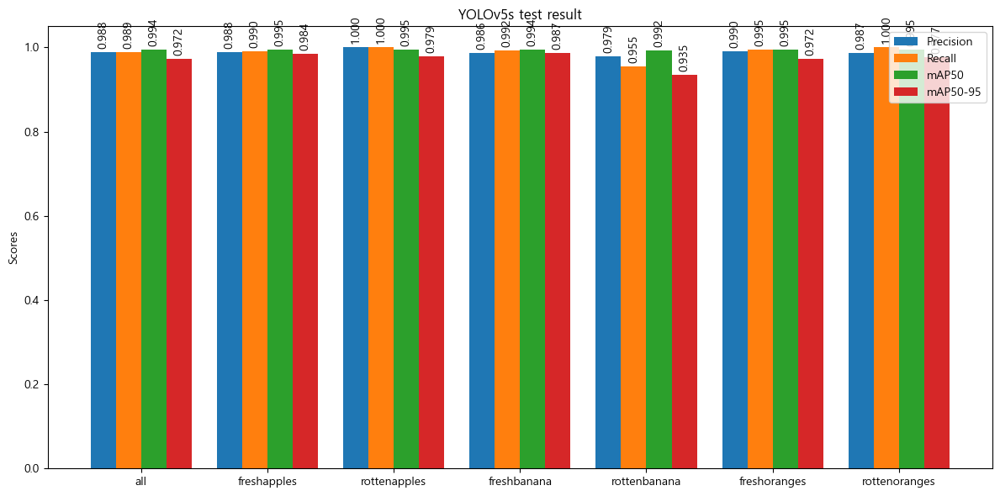

In [30]:
fig=plt.figure(figsize=(12,6),dpi=100)
ax=fig.subplots()

data=pd.read_table('yolov5s_model_test_result_data/test_result.txt',sep='\s+')
data

X=np.arange(len(data))

ax.set_title('YOLOv5s test result')

# 막대 너비 설정
width = 0.2

# 막대 그래프 그리기
rects1 = ax.bar(X - 1.5*width, data['Precision'], width, label='Precision')
rects2 = ax.bar(X - 0.5*width, data['Recall'], width, label='Recall')
rects3 = ax.bar(X + 0.5*width, data['mAP50'], width, label='mAP50')
rects4 = ax.bar(X + 1.5*width, data['mAP50-95'], width, label='mAP50-95')

# 그래프 꾸미기
ax.set_ylabel('Scores')
#ax.set_title('YOLOv5 Performance Metrics by Class')
ax.set_xticks(X)
ax.set_xticklabels(data.index)
ax.legend()

# 막대 위에 값 표시
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', rotation=90)

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)

fig.tight_layout()
plt.show()

Text(0, 0.5, 'Scores')

Text(0.5, 1.0, 'YOLOv5s test result')

[Text(0, 0, 'all'),
 Text(1, 0, 'freshapples'),
 Text(2, 0, 'rottenapples'),
 Text(3, 0, 'freshbanana'),
 Text(4, 0, 'rottenbanana'),
 Text(5, 0, 'freshoranges'),
 Text(6, 0, 'rottenoranges')]

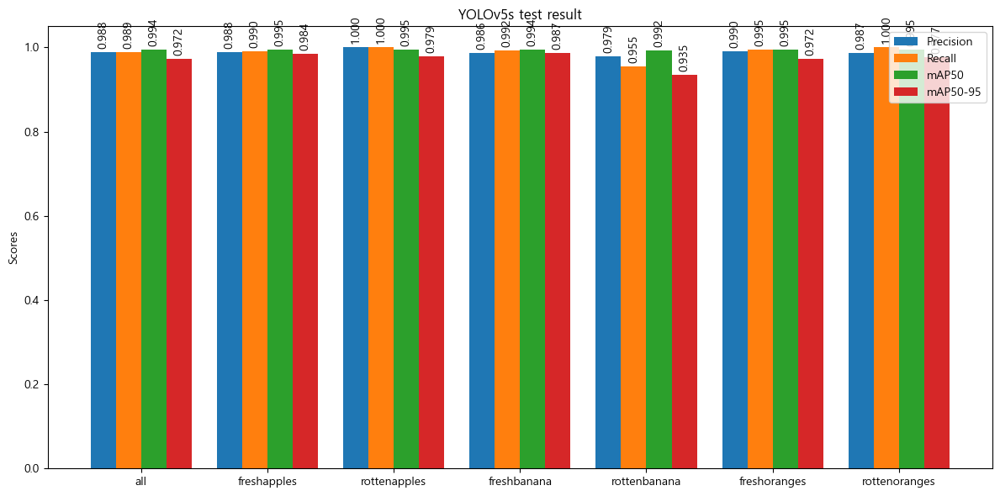

In [29]:
import matplotlib.pyplot as plt
import numpy as np

# 데이터 준비
classes = ['all', 'freshapples', 'rottenapples', 'freshbanana', 'rottenbanana', 'freshoranges', 'rottenoranges']
precision = [0.988, 0.988, 1.000, 0.986, 0.979, 0.990, 0.987]
recall = [0.989, 0.990, 1.000, 0.992, 0.955, 0.995, 1.000]
mAP50 = [0.994, 0.995, 0.995, 0.994, 0.992, 0.995, 0.995]
mAP50_95 = [0.972, 0.984, 0.979, 0.987, 0.935, 0.972, 0.977]

# 그래프 설정
x = np.arange(len(classes))
width = 0.2

fig, ax = plt.subplots(figsize=(12, 6))

# 막대 그래프 그리기
rects1 = ax.bar(x - 1.5*width, precision, width, label='Precision')
rects2 = ax.bar(x - 0.5*width, recall, width, label='Recall')
rects3 = ax.bar(x + 0.5*width, mAP50, width, label='mAP50')
rects4 = ax.bar(x + 1.5*width, mAP50_95, width, label='mAP50-95')

# 그래프 꾸미기
ax.set_ylabel('Scores')
ax.set_title('YOLOv5s test result')
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.legend()

# 막대 위에 값 표시
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', rotation=90)

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)

fig.tight_layout()

plt.show()